# Preparacion de los datos

In [1]:
from utilities import unpickle, tryDataset, mkfolders, os, compute_mixture, load_mixture

(50000, 32, 32, 3)


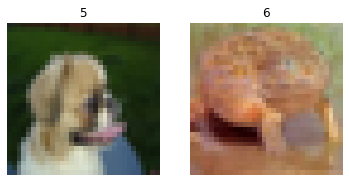

(10000, 32, 32, 3)


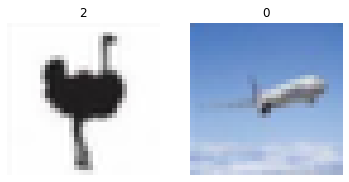

In [2]:
X_train = unpickle("Input\cifar-10-train")
X_test = unpickle("Input\cifar-10-test")
tryDataset(X_train)
tryDataset(X_test)

# Entrenamiento

## Persistencia

In [3]:
_raiz = "Resultados/CIFAR10pruebasAAE"
_nombre = "CIFAR10"

Creamos las carpetas para almacenar el output

In [4]:
mkfolders(_raiz, True)

Carpeta Resultados/CIFAR10pruebasAAE ya existe


## Entrenamiento en grid

In [5]:
from AutoencoderLib import *

Tamaño de la capa latente:

In [6]:
dim_latente_cand = [512, 1024]

Tamaño de las imagenes:

In [7]:
img_shape = X_train["data"][0].shape

Parametros:

In [8]:
discriminators = [(build_discriminator ,"default_disc", {}, {"truth":true_sampler, "truth_kwargs":{}, "falsehood":fake_sampler}),
                    (build_class_discriminator ,"class_disc",{"clases":10}, {"truth":true_sampler_clases, "truth_kwargs":{"nclases":10}, "falsehood":fake_class_sampler})]


ae_losses = [(losses.mean_squared_error, "ae_MSE_loss")]
disc_losses =[(losses.binary_crossentropy, "disc_binXentropy_loss")]

In [9]:
epochs = 12

In [10]:
def tryModel(
    model_name="MODEL", 
    assemble_AAE=assemble_AAE_twoPhased,
    fit_AAE = fit_AAE_twoPhased,
    enc= (build_conv_encoder, "dense_enc", {}), 
    dec = (build_conv_decoder,"dense_dec", {}),
    ae_loss = (losses.mean_squared_error, "ae_MSE_loss"),
    disc = (build_discriminator ,"default_disc", {}, {"truth":true_sampler, "truth_kwargs":{}, "falsehood":fake_sampler}),
    disc_loss = (losses.binary_crossentropy, "disc_binXentropy_loss"),
    dim_latente = 64,
    mixture_data={"override":False, "nombre":"cluster"},
    save=False
    ):
    # Carpeta donde almacenar los resultados
    ruta = _raiz+"\\"+model_name+"\\"+ae_loss[1]+"\\"+disc[1]+"\\"+disc_loss[1]+"\\"+str(dim_latente)
    # Si existen los modelos solo mostrar resultados guardados sin entrenar
    if os.path.isfile(ruta+"/Modelos\\decoder.h5") or os.path.isfile(ruta+"/Modelos\\autoencoder.h5"):
        print(ruta+" ya ha sido entrenada")
        show_prevResults(ruta, epochs=epochs)
        return
    # Crear carpeta
    mkfolders(ruta, True)
    # Intentar cargar datos de mixtura si se trata de un dsicriminador con informacion de clases
    if "clases" in disc[2].keys():
        mixture = load_mixture(ruta="Data/", dataset_name=_nombre, expansion=10, **mixture_data)
        disc[3]["truth_kwargs"].update({"mixture":mixture})
    # Creacion de los modelos
    ck = {"ae_loss": ae_loss[0], "disc_loss":disc_loss[0]}
    aae = assemble_AAE(dim_latente, img_shape, enc_model = enc[0], enc_kwargs=enc[2], dec_model = dec[0], dec_kwargs=dec[2], disc_model = disc[0], disc_kwargs=disc[2], compilation_kwargs=ck)
    # Entrenamiento
    fit_settings = { "epochs":epochs, "ruta" : ruta}
    fit_settings.update(disc[3])
    history = fit_AAE(aae=aae, dim_latente=dim_latente, dataset=X_train, **fit_settings)
    # Obtenemos informacion del numero de clases para mostrar resultados, si no hay se intenta generar una mixtura para mas tarde
    clases=0
    if "clases" in disc[2].keys():
        clases=disc[2]["clases"]
    else:
        compute_mixture(X_train, aae[0], ruta="Data/", dataset_name=_nombre, **mixture_data)
    #Resultados
    print("Historia del entrenamiento:")
    plot_history(history, ruta=ruta, title=ruta)
    print("Imagenes regeneradas desde el set de entrenamiento (arriba originales):")
    sample_imgs(X_train, aae[3], epoch=epochs, nclases=clases, show=True, ruta=ruta, title=ruta+" regeneration", nombre="TRAINSET")
    print("Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):")
    sample_imgs(X_test, aae[3], epoch=epochs, nclases=clases, show=True, ruta=ruta, title=ruta+" regeneration", nombre="TESTSET")
    print("Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):")
    exploraLatente(aae[0], aae[1], "Input\cifar-10-groupedtrain", ruta=ruta, nombre="GenFromLatentTRAINSET")
    print("Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):")
    exploraLatente(aae[0], aae[1], "Input\cifar-10-groupedtest", ruta=ruta, nombre="GenFromLatentTESTSET")
    # Guardado de modelos
    if save:
        mkfolders(ruta+"/Modelos")
        aae[1].save(ruta+"/Modelos\\decoder.h5")
        aae[3].save(ruta+"/Modelos\\autoencoder.h5")


### Entrenamiento de AAE Convolucional - Def depth, 2p train

Sin clases

Carpeta Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL\ae_MSE_loss\default_disc\disc_binXentropy_loss\512 ya existe
Entrenando: Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL\ae_MSE_loss\default_disc\disc_binXentropy_loss\512


C:\Users\bitde\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\engine\functional.py:559: UserWarning: Input dict contained keys ['labels'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


E0 <██████████> 100% DISC: [loss: 0.000005, acc: 100.00%] AAE: [mse: 12.104657, b_ce: 0.037116] 41.42s		
E1 <██████████> 100% DISC: [loss: 0.001072, acc: 100.00%] AAE: [mse: 7.274884, b_ce: 0.035731] 33.80s		
E2 <██████████> 100% DISC: [loss: 0.000110, acc: 100.00%] AAE: [mse: 8.993132, b_ce: 0.034455] 33.79s		
E3 <██████████> 100% DISC: [loss: 0.000011, acc: 100.00%] AAE: [mse: 11.430310, b_ce: 0.032578] 33.70s		
E4 <██████████> 100% DISC: [loss: 0.000000, acc: 100.00%] AAE: [mse: 15.841753, b_ce: 0.032258] 34.44s		
E5 <██████████> 100% DISC: [loss: 0.000432, acc: 100.00%] AAE: [mse: 10.954318, b_ce: 0.033497] 34.79s		
E6 <██████████> 100% DISC: [loss: 0.014430, acc: 99.50%] AAE: [mse: 15.459409, b_ce: 0.032759] 34.72s		
E7 <██████████> 100% DISC: [loss: 0.000000, acc: 100.00%] AAE: [mse: 34.130653, b_ce: 0.037867] 34.30s		
E8 <██████████> 100% DISC: [loss: 0.095199, acc: 99.00%] AAE: [mse: 21.980091, b_ce: 0.036237] 34.47s		
E9 <██████████> 100% DISC: [loss: 0.002060, acc: 100.00%] A

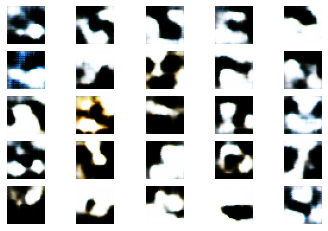

Guardando datos de la mixtura para CIFAR10-512convoCluster
Historia del entrenamiento:


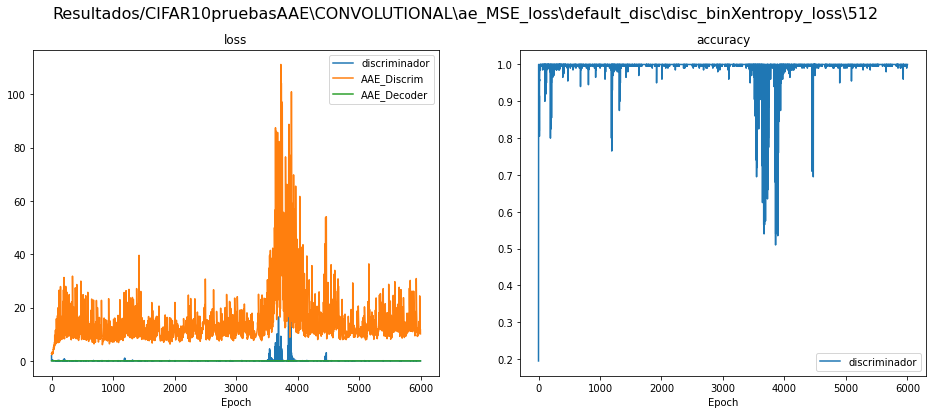

Imagenes regeneradas desde el set de entrenamiento (arriba originales):


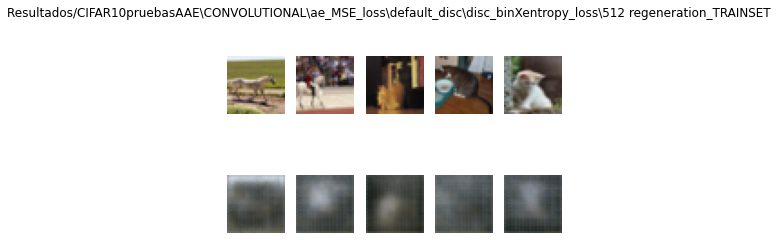

Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):


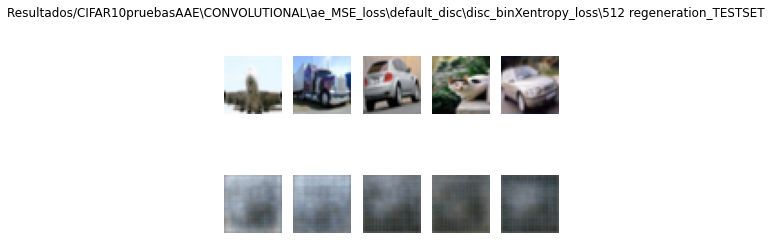

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):


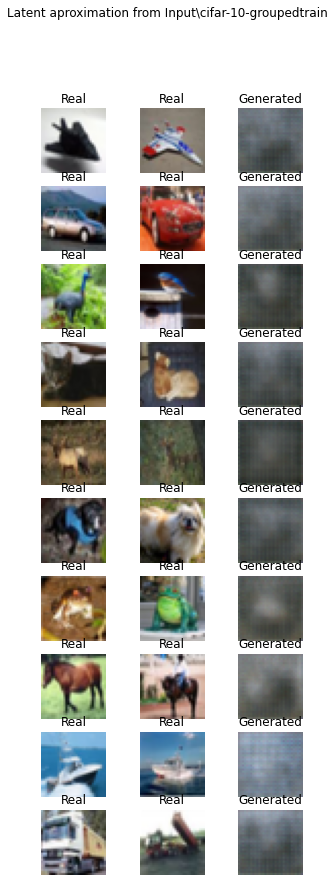

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):


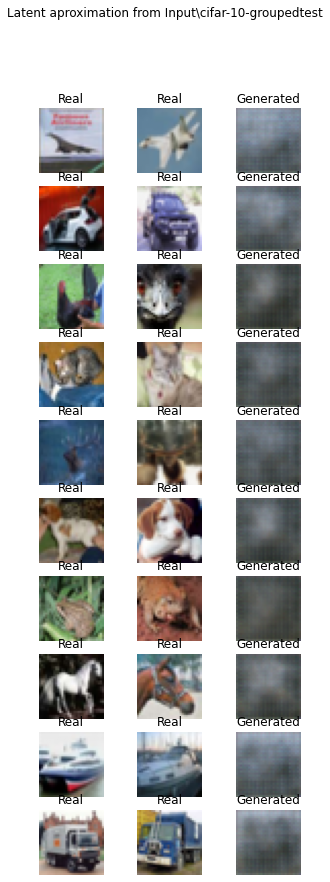

Carpeta Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL\ae_MSE_loss\default_disc\disc_binXentropy_loss\1024 ya existe
Entrenando: Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL\ae_MSE_loss\default_disc\disc_binXentropy_loss\1024


C:\Users\bitde\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\engine\functional.py:559: UserWarning: Input dict contained keys ['labels'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


E0 <██████████> 100% DISC: [loss: 0.004820, acc: 99.50%] AAE: [mse: 13.769005, b_ce: 0.033593] 35.57s		
E1 <██████████> 100% DISC: [loss: 0.049575, acc: 99.50%] AAE: [mse: 11.140700, b_ce: 0.040484] 35.15s		
E2 <██████████> 100% DISC: [loss: 0.006503, acc: 99.50%] AAE: [mse: 12.069036, b_ce: 0.032843] 35.16s		
E3 <██████████> 100% DISC: [loss: 0.001745, acc: 100.00%] AAE: [mse: 13.591737, b_ce: 0.037079] 35.44s		
E4 <██████████> 100% DISC: [loss: 0.000024, acc: 100.00%] AAE: [mse: 12.730474, b_ce: 0.031825] 42.80s		
E5 <██████████> 100% DISC: [loss: 0.002996, acc: 100.00%] AAE: [mse: 18.591894, b_ce: 0.036315] 41.25s		
E6 <██████████> 100% DISC: [loss: 0.000006, acc: 100.00%] AAE: [mse: 16.333971, b_ce: 0.030629] 41.92s		
E7 <██████████> 100% DISC: [loss: 0.000410, acc: 100.00%] AAE: [mse: 16.971453, b_ce: 0.037103] 37.11s		
E8 <██████████> 100% DISC: [loss: 0.000326, acc: 100.00%] AAE: [mse: 26.171608, b_ce: 0.033470] 37.03s		
E9 <██████████> 100% DISC: [loss: 0.000012, acc: 100.00%] 

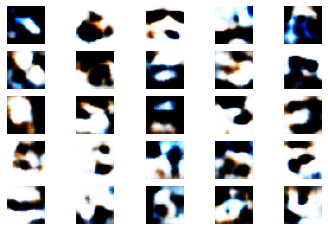

Guardando datos de la mixtura para CIFAR10-1024convoCluster
Historia del entrenamiento:


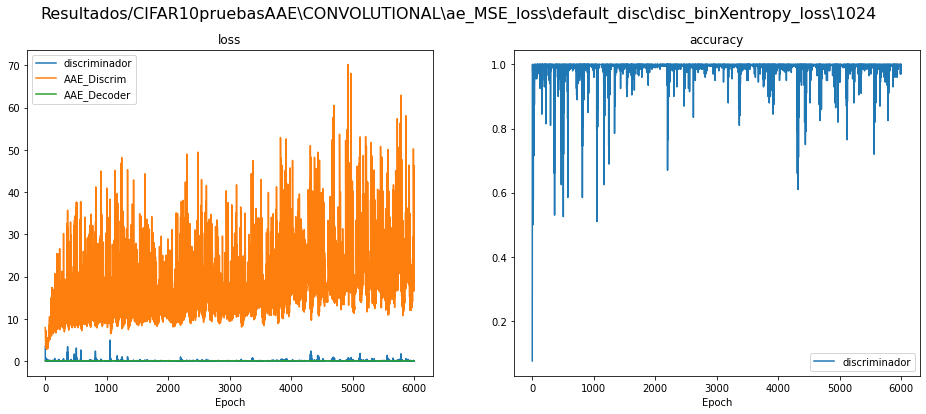

Imagenes regeneradas desde el set de entrenamiento (arriba originales):


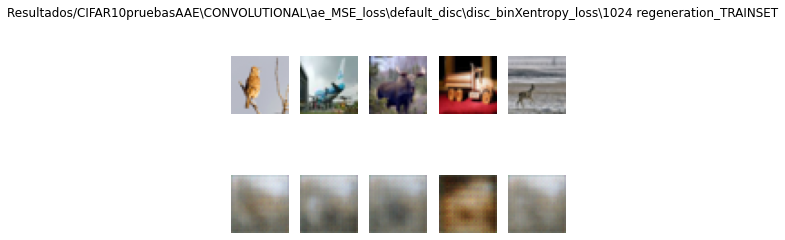

Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):


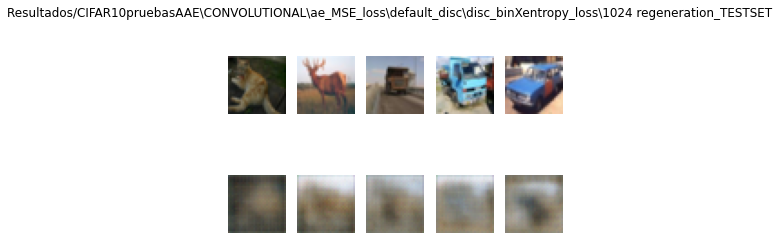

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):


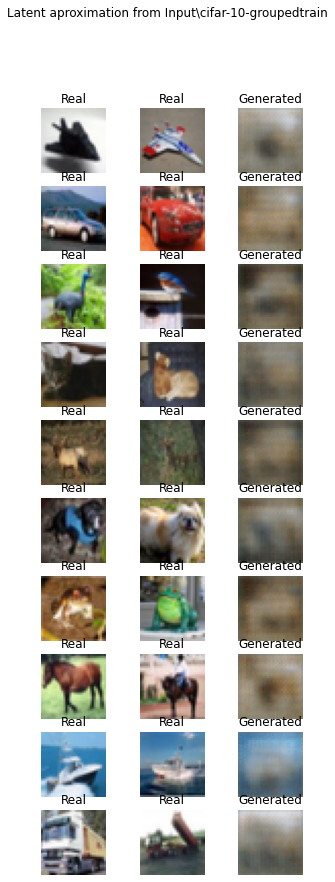

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):


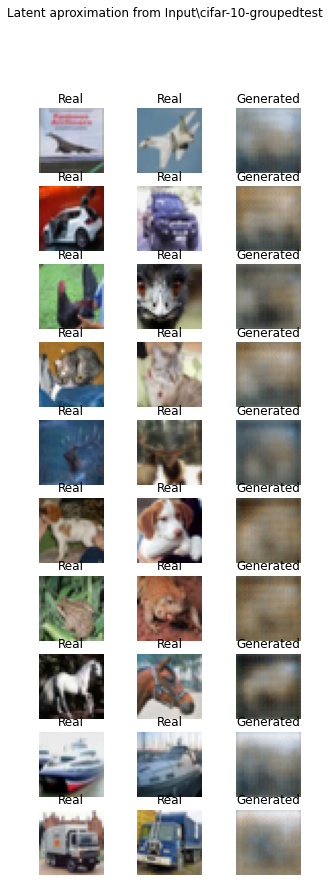

In [12]:
model_name = "CONVOLUTIONAL"

encoder = (build_conv_encoder, "dense_enc", {})
decoder = (build_conv_decoder,"dense_dec", {})
for dim_latente in dim_latente_cand:
    tryModel(enc = encoder, dec=decoder, dim_latente=dim_latente, model_name=model_name, mixture_data={"override":True, "nombre":str(dim_latente)+"convoCluster"})


Con clases

Entrenando: Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL_C\ae_MSE_loss\default_disc\disc_binXentropy_loss\512


C:\Users\bitde\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\engine\functional.py:559: UserWarning: Input dict contained keys ['labels'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


E0 <██████████> 100% DISC: [loss: 0.003807, acc: 100.00%] AAE: [mse: 9.351317, b_ce: 0.040554] 37.45s		
E1 <██████████> 100% DISC: [loss: 0.049972, acc: 99.00%] AAE: [mse: 8.805131, b_ce: 0.034589] 36.34s			
E2 <██████████> 100% DISC: [loss: 0.001569, acc: 100.00%] AAE: [mse: 11.781310, b_ce: 0.025474] 34.81s		
E3 <██████████> 100% DISC: [loss: 0.000129, acc: 100.00%] AAE: [mse: 8.526355, b_ce: 0.026290] 33.84s		
E4 <██████████> 100% DISC: [loss: 0.000020, acc: 100.00%] AAE: [mse: 10.378757, b_ce: 0.029446] 33.94s		
E5 <██████████> 100% DISC: [loss: 0.000039, acc: 100.00%] AAE: [mse: 10.104905, b_ce: 0.030199] 33.82s		
E6 <██████████> 100% DISC: [loss: 0.000671, acc: 100.00%] AAE: [mse: 7.584750, b_ce: 0.026020] 34.00s		
E7 <██████████> 100% DISC: [loss: 0.000049, acc: 100.00%] AAE: [mse: 9.379561, b_ce: 0.029312] 33.69s		
E8 <██████████> 100% DISC: [loss: 0.056978, acc: 99.50%] AAE: [mse: 25.149830, b_ce: 0.032090] 34.22s		
E9 <██████████> 100% DISC: [loss: 0.000001, acc: 100.00%] AAE

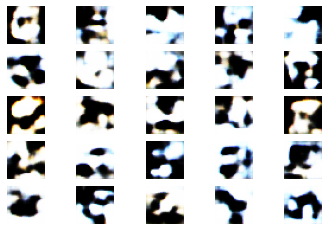

Guardando datos de la mixtura para CIFAR10-512convoCluster
Historia del entrenamiento:


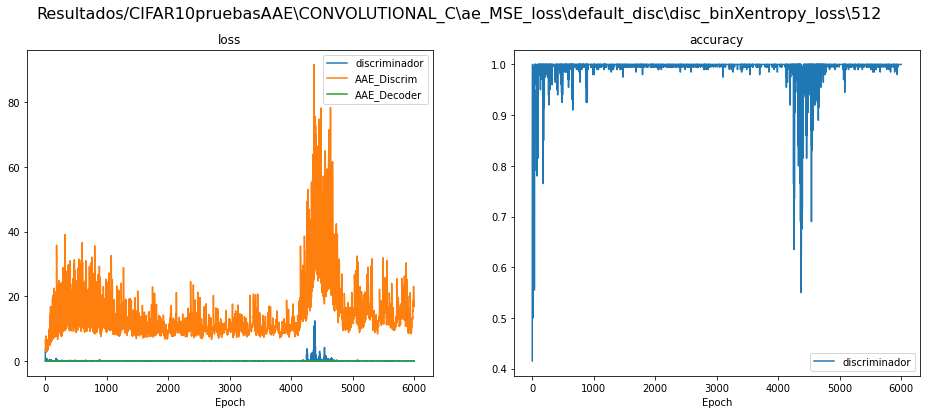

Imagenes regeneradas desde el set de entrenamiento (arriba originales):


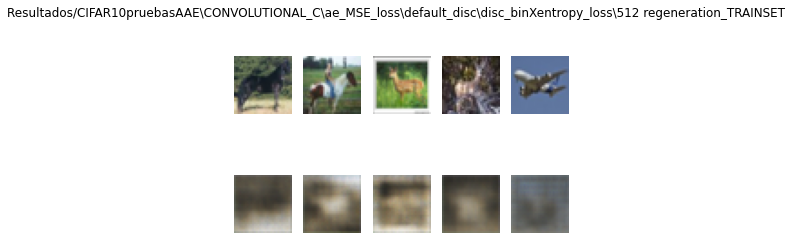

Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):


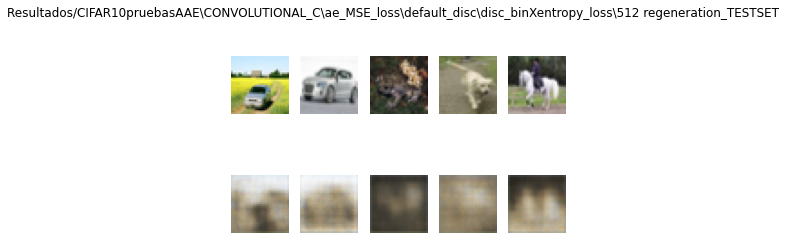

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):


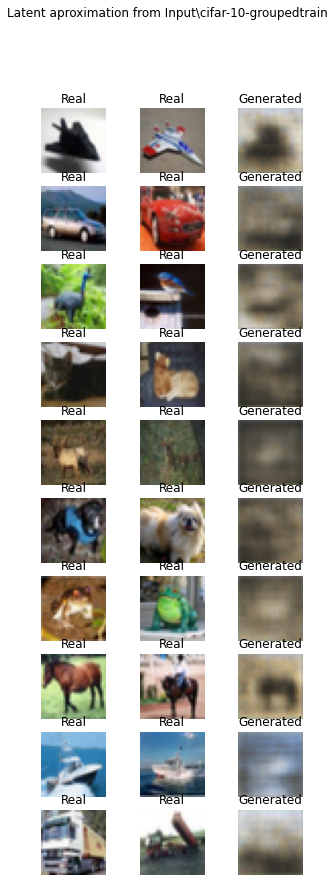

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):


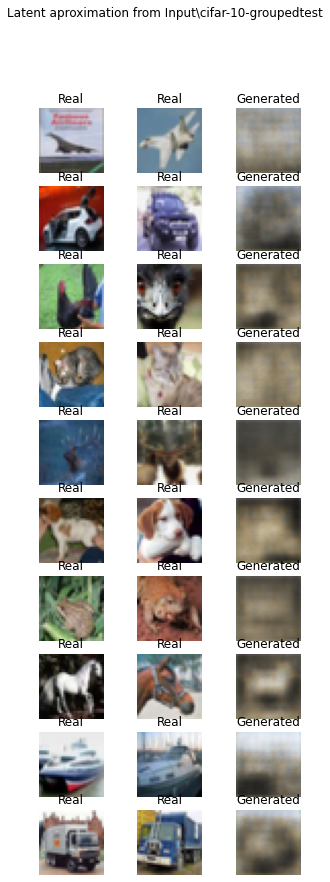

Entrenando: Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL_C\ae_MSE_loss\default_disc\disc_binXentropy_loss\1024


C:\Users\bitde\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\engine\functional.py:559: UserWarning: Input dict contained keys ['labels'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


E0 <██████████> 100% DISC: [loss: 0.391228, acc: 84.00%] AAE: [mse: 27.732841, b_ce: 0.052457] 38.45s		
E1 <██████████> 100% DISC: [loss: 0.000292, acc: 100.00%] AAE: [mse: 10.493305, b_ce: 0.036746] 38.57s		
E2 <██████████> 100% DISC: [loss: 0.000165, acc: 100.00%] AAE: [mse: 9.633081, b_ce: 0.028832] 37.32s		
E3 <██████████> 100% DISC: [loss: 0.000323, acc: 100.00%] AAE: [mse: 10.901811, b_ce: 0.034888] 35.28s		
E4 <██████████> 100% DISC: [loss: 0.003324, acc: 100.00%] AAE: [mse: 10.069212, b_ce: 0.033236] 34.55s		
E5 <██████████> 100% DISC: [loss: 0.000269, acc: 100.00%] AAE: [mse: 11.319491, b_ce: 0.039764] 34.67s		
E6 <██████████> 100% DISC: [loss: 0.007138, acc: 99.50%] AAE: [mse: 14.458287, b_ce: 0.031683] 34.76s		
E7 <██████████> 100% DISC: [loss: 0.013760, acc: 99.50%] AAE: [mse: 8.442933, b_ce: 0.037812] 34.85s			
E8 <██████████> 100% DISC: [loss: 0.000354, acc: 100.00%] AAE: [mse: 8.462449, b_ce: 0.031012] 35.05s		
E9 <██████████> 100% DISC: [loss: 0.000241, acc: 100.00%] AA

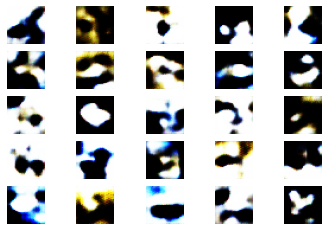

Guardando datos de la mixtura para CIFAR10-1024convoCluster
Historia del entrenamiento:


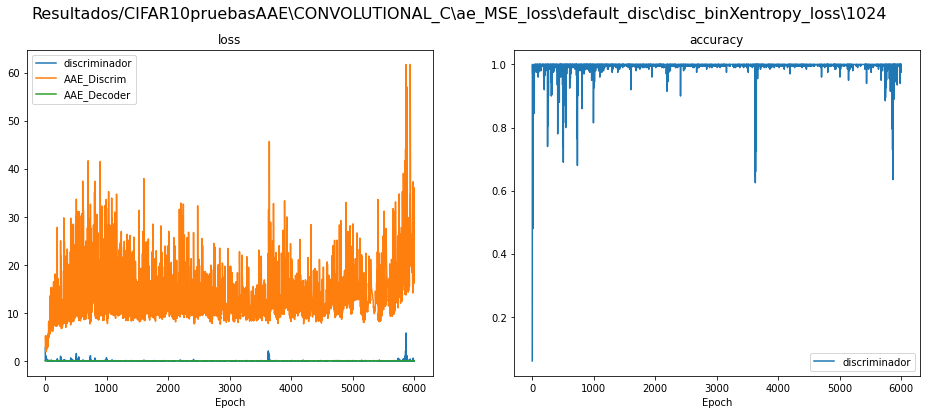

Imagenes regeneradas desde el set de entrenamiento (arriba originales):


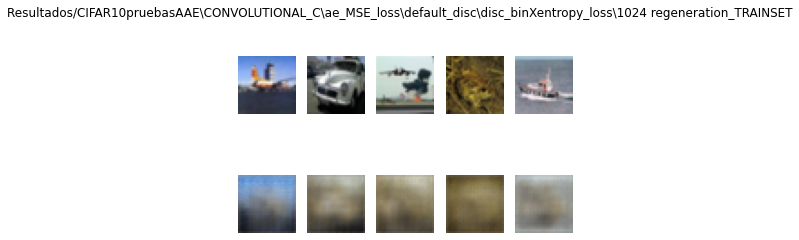

Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):


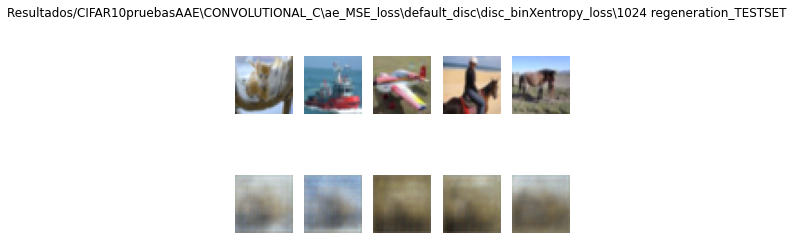

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):


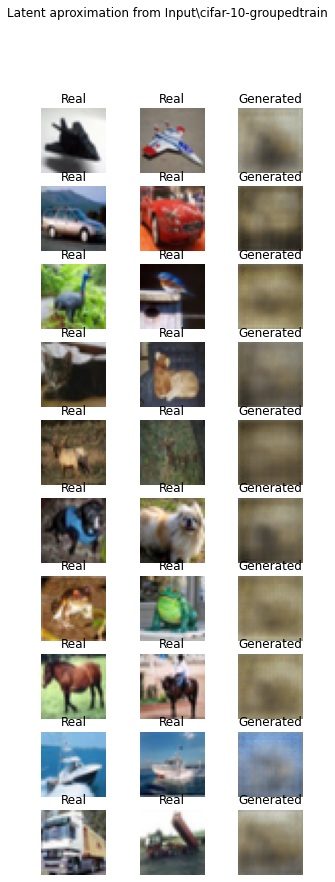

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):


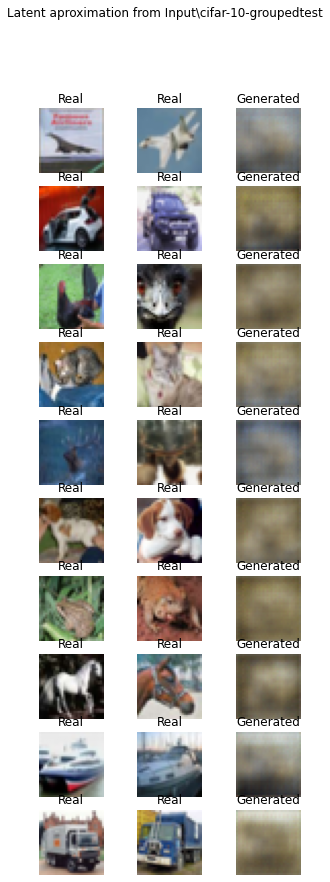

In [13]:
discriminator = (build_class_discriminator ,"class_disc",{"clases":10}, {"truth":true_sampler_clases, "truth_kwargs":{"nclases":10}, "falsehood":fake_class_sampler})
model_name = "CONVOLUTIONAL_C"

encoder = (build_conv_encoder, "dense_enc", {})
decoder = (build_conv_decoder,"dense_dec", {})
for dim_latente in dim_latente_cand:
    tryModel(enc = encoder, dec=decoder, dim_latente=dim_latente, model_name=model_name, mixture_data={"override":True, "nombre":str(dim_latente)+"convoCluster"})

Con clases(cluster)

Carpeta Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL_C\ae_MSE_loss\default_disc\disc_binXentropy_loss\512 ya existe
Entrenando: Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL_C\ae_MSE_loss\default_disc\disc_binXentropy_loss\512


C:\Users\bitde\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\engine\functional.py:559: UserWarning: Input dict contained keys ['labels'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


E0 <██████████> 100% DISC: [loss: 0.029732, acc: 98.50%] AAE: [mse: 16.789532, b_ce: 0.035251] 34.96s		
E1 <██████████> 100% DISC: [loss: 0.000197, acc: 100.00%] AAE: [mse: 21.213678, b_ce: 0.026674] 34.22s		
E2 <██████████> 100% DISC: [loss: 0.000582, acc: 100.00%] AAE: [mse: 20.032484, b_ce: 0.045917] 34.17s		
E3 <██████████> 100% DISC: [loss: 0.002950, acc: 100.00%] AAE: [mse: 13.219769, b_ce: 0.034084] 34.30s		
E4 <██████████> 100% DISC: [loss: 0.000020, acc: 100.00%] AAE: [mse: 20.047184, b_ce: 0.027210] 34.26s		
E5 <██████████> 100% DISC: [loss: 0.008208, acc: 100.00%] AAE: [mse: 27.930525, b_ce: 0.030420] 34.55s		
E6 <██████████> 100% DISC: [loss: 0.000241, acc: 100.00%] AAE: [mse: 9.841249, b_ce: 0.031438] 34.05s		
E7 <██████████> 100% DISC: [loss: 0.000061, acc: 100.00%] AAE: [mse: 9.239022, b_ce: 0.030629] 34.48s		
E8 <██████████> 100% DISC: [loss: 0.000057, acc: 100.00%] AAE: [mse: 10.446026, b_ce: 0.029757] 34.37s		
E9 <██████████> 100% DISC: [loss: 0.000284, acc: 100.00%] 

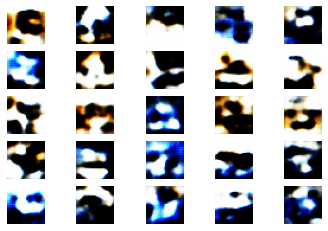

Guardando datos de la mixtura para CIFAR10-512convoCluster
Historia del entrenamiento:


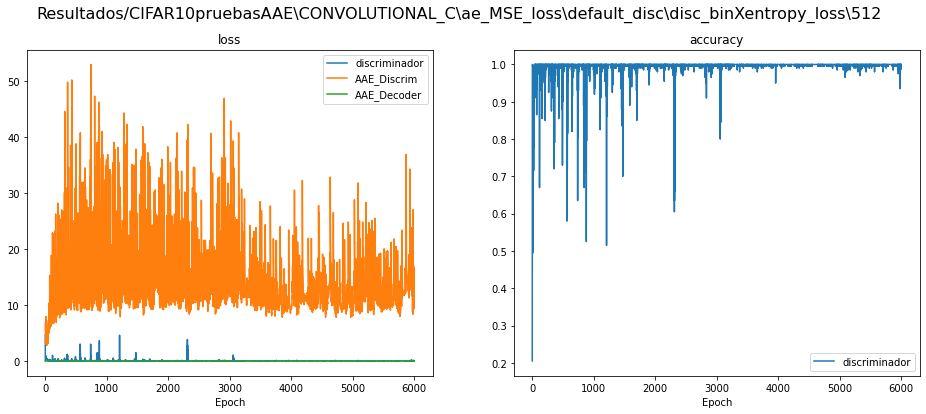

Imagenes regeneradas desde el set de entrenamiento (arriba originales):


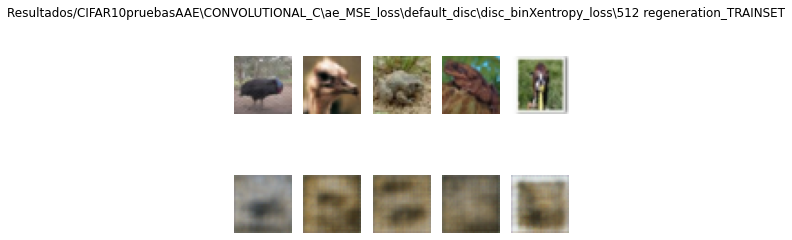

Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):


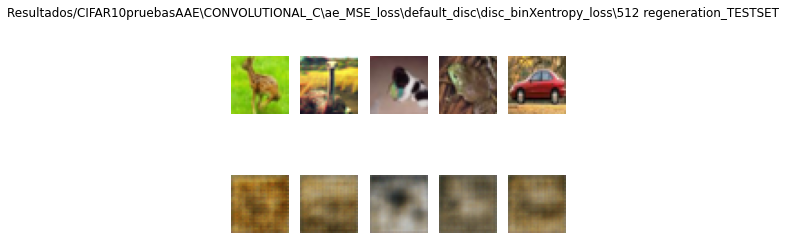

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):


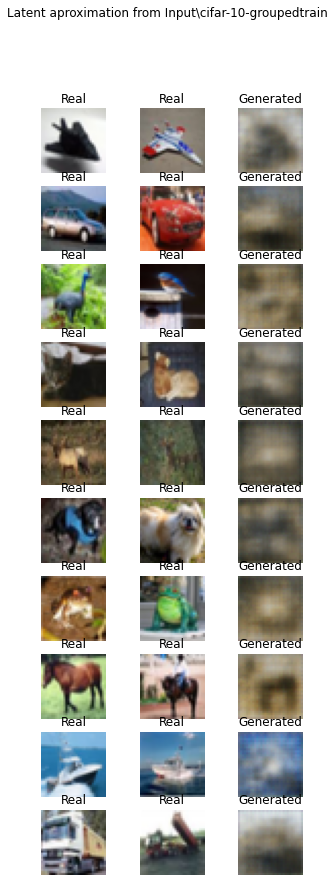

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):


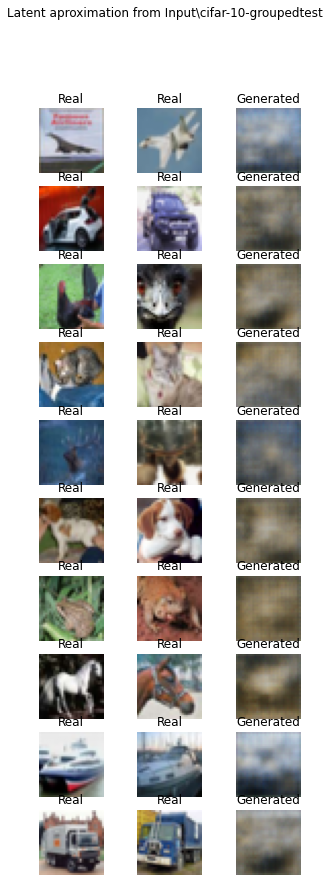

Carpeta Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL_C\ae_MSE_loss\default_disc\disc_binXentropy_loss\1024 ya existe
Entrenando: Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL_C\ae_MSE_loss\default_disc\disc_binXentropy_loss\1024


C:\Users\bitde\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\engine\functional.py:559: UserWarning: Input dict contained keys ['labels'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


E0 <██████████> 100% DISC: [loss: 0.000953, acc: 100.00%] AAE: [mse: 21.819557, b_ce: 0.040968] 36.00s		
E1 <██████████> 100% DISC: [loss: 0.000250, acc: 100.00%] AAE: [mse: 8.574384, b_ce: 0.031106] 34.92s		
E2 <██████████> 100% DISC: [loss: 0.000926, acc: 100.00%] AAE: [mse: 8.028785, b_ce: 0.042321] 35.20s		
E3 <██████████> 100% DISC: [loss: 0.000525, acc: 100.00%] AAE: [mse: 7.738782, b_ce: 0.042508] 34.97s		
E4 <██████████> 100% DISC: [loss: 0.012946, acc: 99.50%] AAE: [mse: 13.565627, b_ce: 0.054459] 35.19s		
E5 <██████████> 100% DISC: [loss: 0.000757, acc: 100.00%] AAE: [mse: 10.092711, b_ce: 0.033429] 35.26s		
E6 <██████████> 100% DISC: [loss: 0.000000, acc: 100.00%] AAE: [mse: 39.820225, b_ce: 0.040703] 35.21s		
E7 <██████████> 100% DISC: [loss: 0.000085, acc: 100.00%] AAE: [mse: 9.542130, b_ce: 0.043918] 35.10s		
E8 <██████████> 100% DISC: [loss: 0.000063, acc: 100.00%] AAE: [mse: 9.713942, b_ce: 0.046036] 35.48s		
E9 <██████████> 100% DISC: [loss: 0.000004, acc: 100.00%] AAE

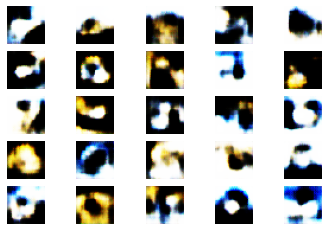

Guardando datos de la mixtura para CIFAR10-1024convoCluster
Historia del entrenamiento:


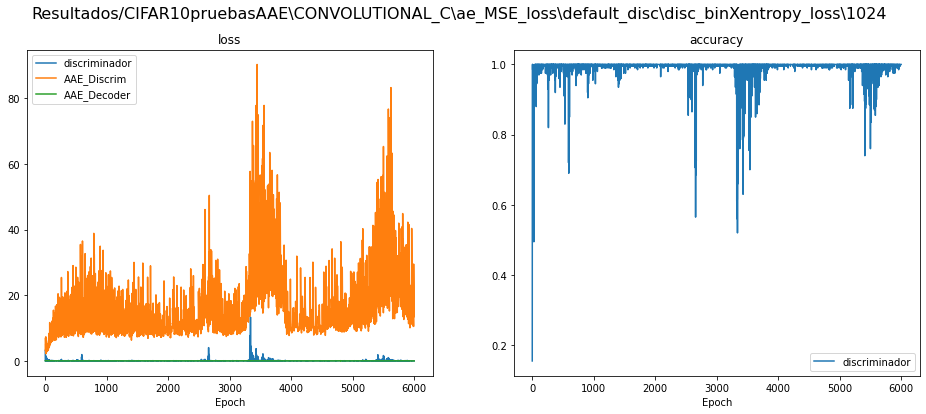

Imagenes regeneradas desde el set de entrenamiento (arriba originales):


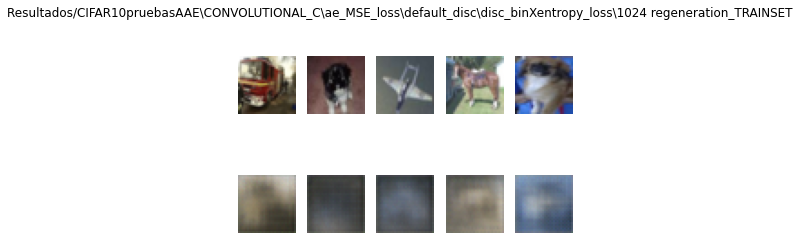

Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):


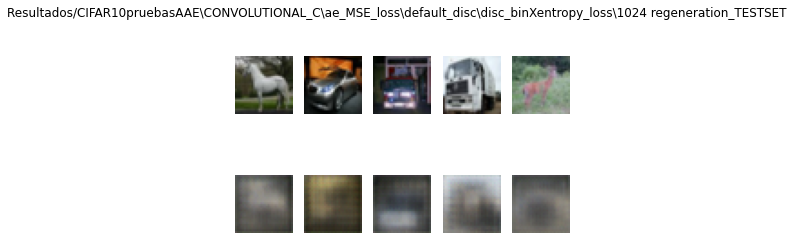

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):


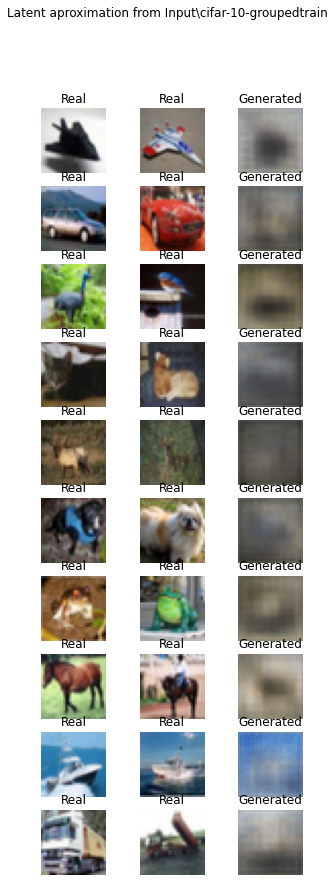

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):


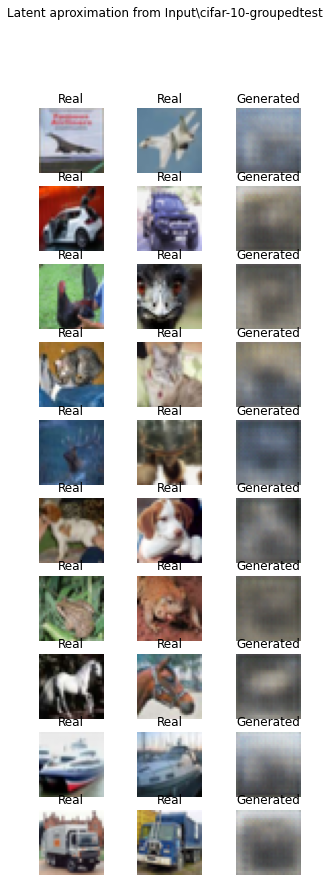

In [14]:

discriminator = (build_class_discriminator ,"class_disc",{"clases":10}, {"truth":genFromMixture, "truth_kwargs":{"nclases":10}, "falsehood":fake_class_sampler})
model_name = "CONVOLUTIONAL_C"

encoder = (build_conv_encoder, "dense_enc", {})
decoder = (build_conv_decoder,"dense_dec", {})
for dim_latente in dim_latente_cand:
    tryModel(enc = encoder, dec=decoder, dim_latente=dim_latente, model_name=model_name, mixture_data={"override":True, "nombre":str(dim_latente)+"convoCluster"})

### Entrenamiento de AAE Convolucional - 3 depth, 2p train

Sin clases

Carpeta Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL\ae_MSE_loss\default_disc\disc_binXentropy_loss\512 ya existe
Entrenando: Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL\ae_MSE_loss\default_disc\disc_binXentropy_loss\512


C:\Users\bitde\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\engine\functional.py:559: UserWarning: Input dict contained keys ['labels'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


E0 <██████████> 100% DISC: [loss: 0.000070, acc: 100.00%] AAE: [mse: 9.755885, b_ce: 0.043517] 36.18s		
E1 <██████████> 100% DISC: [loss: 0.005399, acc: 100.00%] AAE: [mse: 14.194942, b_ce: 0.037335] 35.46s		
E2 <██████████> 100% DISC: [loss: 0.000008, acc: 100.00%] AAE: [mse: 20.203976, b_ce: 0.042740] 35.15s		
E3 <██████████> 100% DISC: [loss: 0.000420, acc: 100.00%] AAE: [mse: 19.827074, b_ce: 0.058761] 35.02s		
E4 <██████████> 100% DISC: [loss: 0.000006, acc: 100.00%] AAE: [mse: 17.244946, b_ce: 0.052007] 35.03s		
E5 <██████████> 100% DISC: [loss: 0.017452, acc: 99.50%] AAE: [mse: 8.999434, b_ce: 0.045730] 35.07s			
E6 <██████████> 100% DISC: [loss: 0.000061, acc: 100.00%] AAE: [mse: 9.329469, b_ce: 0.062654] 35.34s		
E7 <██████████> 100% DISC: [loss: 0.000012, acc: 100.00%] AAE: [mse: 18.665277, b_ce: 0.065709] 35.18s		
E8 <██████████> 100% DISC: [loss: 0.000005, acc: 100.00%] AAE: [mse: 11.722926, b_ce: 0.057249] 36.01s		
E9 <██████████> 100% DISC: [loss: 0.000000, acc: 100.00%] 

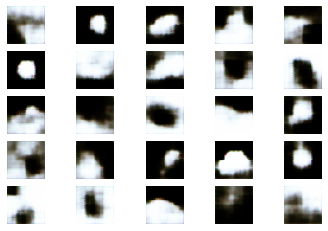

Guardando datos de la mixtura para CIFAR10-512convo3Cluster
Historia del entrenamiento:


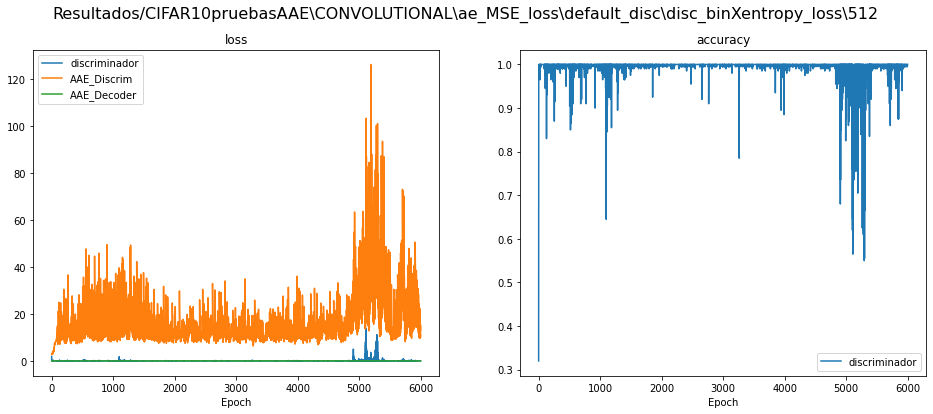

Imagenes regeneradas desde el set de entrenamiento (arriba originales):


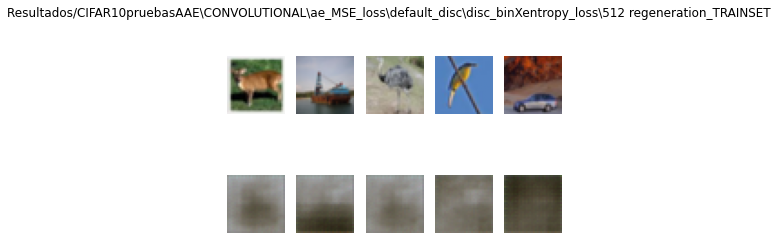

Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):


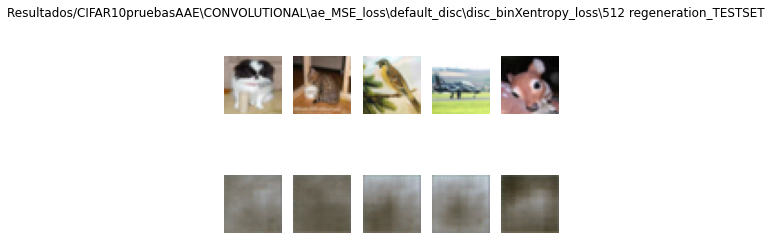

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):


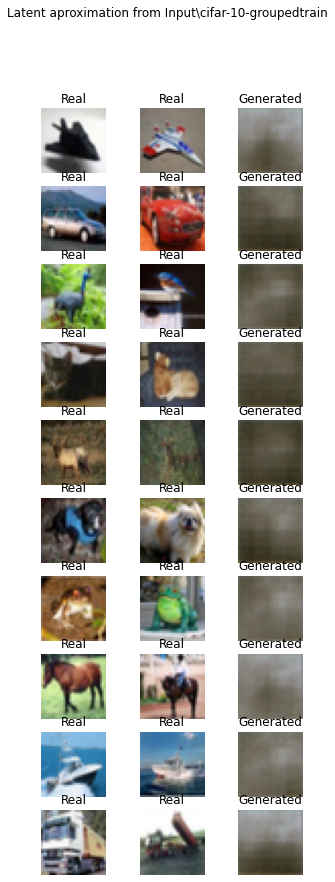

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):


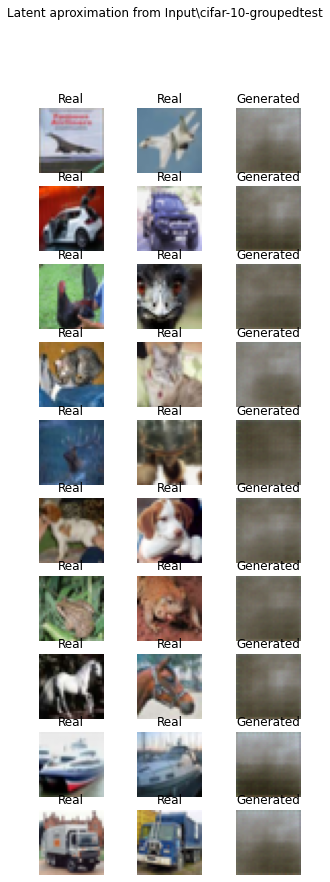

Carpeta Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL\ae_MSE_loss\default_disc\disc_binXentropy_loss\1024 ya existe
Entrenando: Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL\ae_MSE_loss\default_disc\disc_binXentropy_loss\1024


C:\Users\bitde\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\engine\functional.py:559: UserWarning: Input dict contained keys ['labels'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


E0 <██████████> 100% DISC: [loss: 0.000961, acc: 100.00%] AAE: [mse: 9.223467, b_ce: 0.055567] 36.96s		
E1 <██████████> 100% DISC: [loss: 0.012443, acc: 100.00%] AAE: [mse: 19.950579, b_ce: 0.059698] 36.07s		
E2 <██████████> 100% DISC: [loss: 0.000164, acc: 100.00%] AAE: [mse: 16.454609, b_ce: 0.049022] 36.14s		
E3 <██████████> 100% DISC: [loss: 0.000208, acc: 100.00%] AAE: [mse: 10.017422, b_ce: 0.063402] 36.15s		
E4 <██████████> 100% DISC: [loss: 0.000097, acc: 100.00%] AAE: [mse: 9.072117, b_ce: 0.042429] 36.10s		
E5 <██████████> 100% DISC: [loss: 0.244449, acc: 99.00%] AAE: [mse: 13.010578, b_ce: 0.043840] 36.44s		
E6 <██████████> 100% DISC: [loss: 0.000528, acc: 100.00%] AAE: [mse: 9.440811, b_ce: 0.053341] 36.16s		
E7 <██████████> 100% DISC: [loss: 0.000022, acc: 100.00%] AAE: [mse: 11.361783, b_ce: 0.053738] 36.35s		
E8 <██████████> 100% DISC: [loss: 0.000000, acc: 100.00%] AAE: [mse: 26.185017, b_ce: 0.045452] 36.49s		
E9 <██████████> 100% DISC: [loss: 0.162802, acc: 95.00%] AA

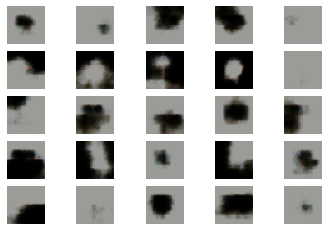

Guardando datos de la mixtura para CIFAR10-1024convo3Cluster
Historia del entrenamiento:


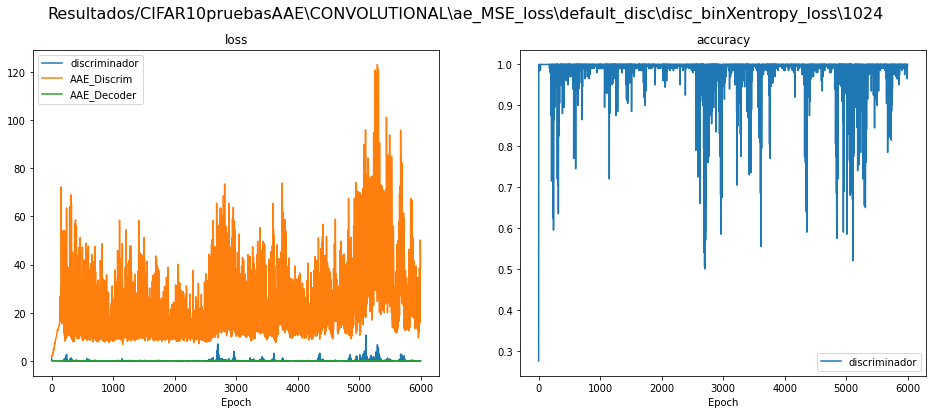

Imagenes regeneradas desde el set de entrenamiento (arriba originales):


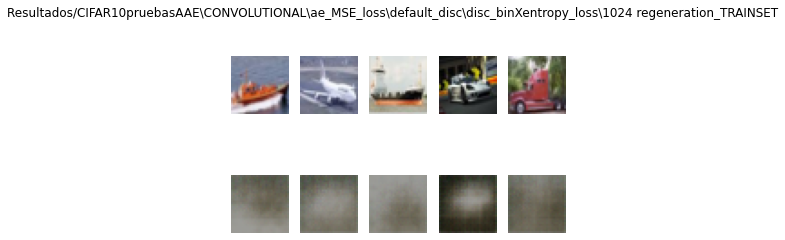

Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):


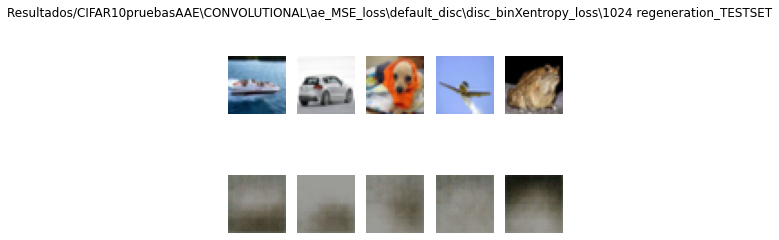

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):


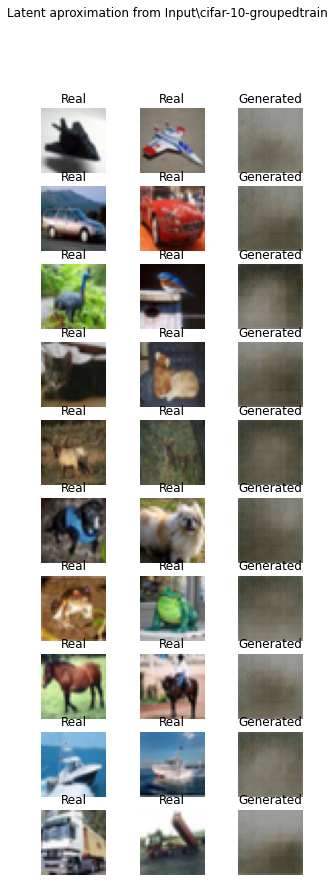

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):


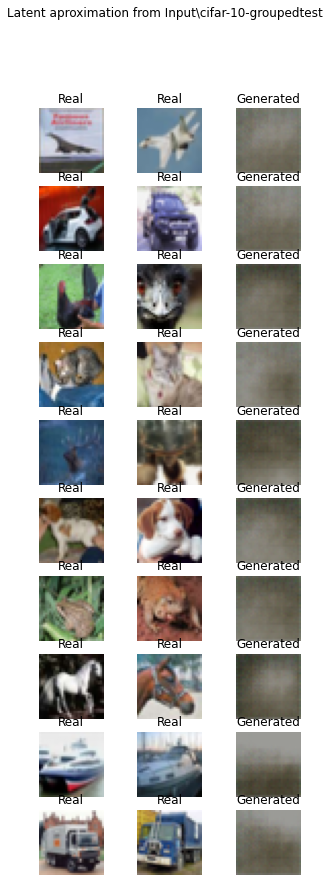

In [15]:
model_name = "CONVOLUTIONAL"

encoder = (build_conv_encoder, "dense_enc", {"depth":3})
decoder = (build_conv_decoder,"dense_dec", {"depth":3})
for dim_latente in dim_latente_cand:
    tryModel(enc = encoder, dec=decoder, dim_latente=dim_latente, model_name=model_name, mixture_data={"override":True, "nombre":str(dim_latente)+"convo3Cluster"})


Con clases

Carpeta Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL_C\ae_MSE_loss\default_disc\disc_binXentropy_loss\512 ya existe
Entrenando: Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL_C\ae_MSE_loss\default_disc\disc_binXentropy_loss\512


C:\Users\bitde\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\engine\functional.py:559: UserWarning: Input dict contained keys ['labels'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


E0 <██████████> 100% DISC: [loss: 0.001265, acc: 100.00%] AAE: [mse: 11.064304, b_ce: 0.036316] 36.43s		
E1 <██████████> 100% DISC: [loss: 0.003926, acc: 99.50%] AAE: [mse: 18.555166, b_ce: 0.033845] 35.08s		
E2 <██████████> 100% DISC: [loss: 0.007249, acc: 99.50%] AAE: [mse: 16.299034, b_ce: 0.034439] 35.05s		
E3 <██████████> 100% DISC: [loss: 0.000340, acc: 100.00%] AAE: [mse: 13.193903, b_ce: 0.033650] 35.27s		
E4 <██████████> 100% DISC: [loss: 0.000352, acc: 100.00%] AAE: [mse: 8.159250, b_ce: 0.031204] 35.01s		
E5 <██████████> 100% DISC: [loss: 0.000246, acc: 100.00%] AAE: [mse: 10.478901, b_ce: 0.032813] 35.12s		
E6 <██████████> 100% DISC: [loss: 4.082136, acc: 62.00%] AAE: [mse: 79.847198, b_ce: 0.060015] 35.10s		
E7 <██████████> 100% DISC: [loss: 0.106515, acc: 98.50%] AAE: [mse: 35.729053, b_ce: 0.049091] 35.37s		
E8 <██████████> 100% DISC: [loss: 0.018459, acc: 99.00%] AAE: [mse: 21.055553, b_ce: 0.036658] 35.31s		
E9 <██████████> 100% DISC: [loss: 0.248762, acc: 97.00%] AAE:

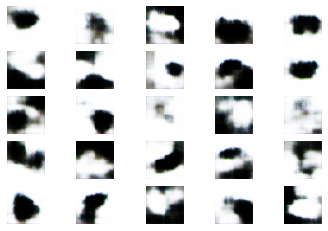

Historia del entrenamiento:


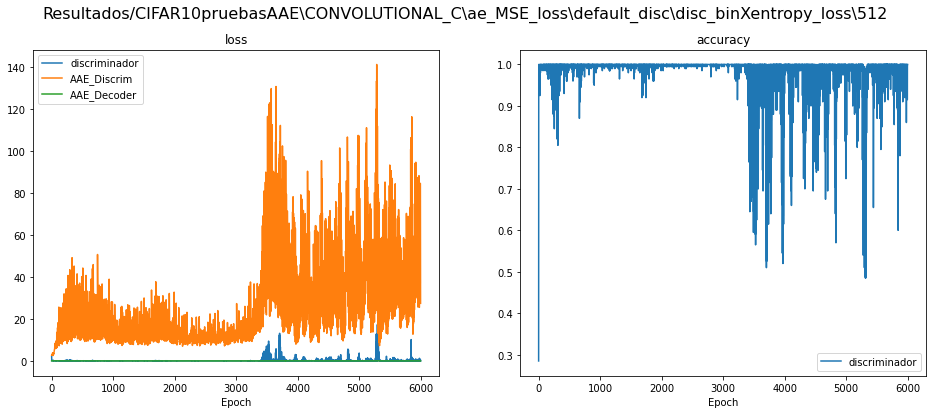

Imagenes regeneradas desde el set de entrenamiento (arriba originales):


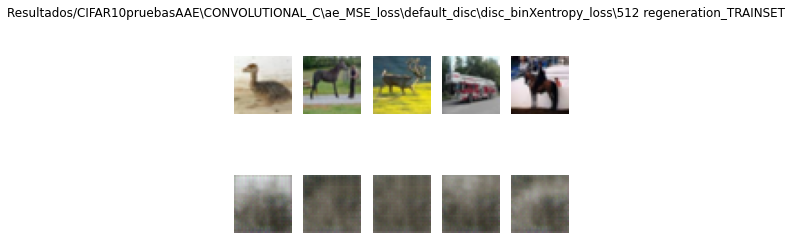

Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):


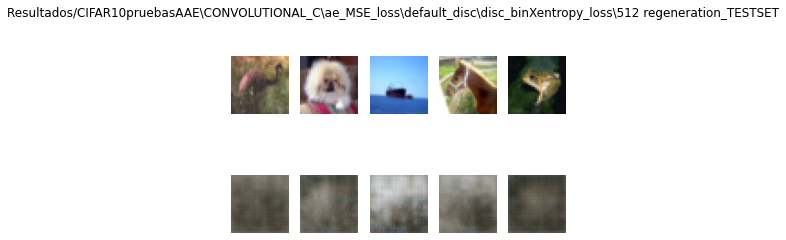

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):


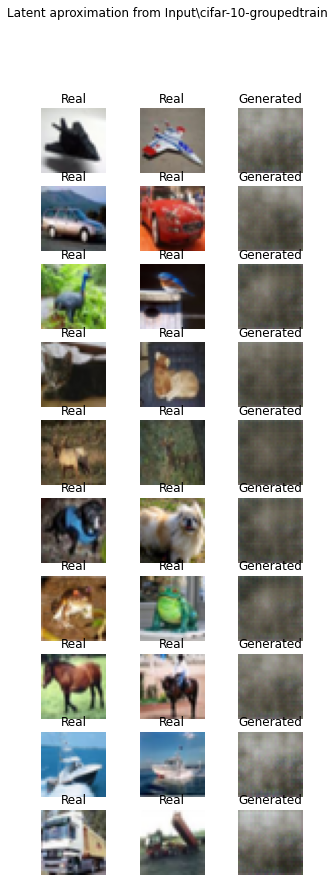

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):


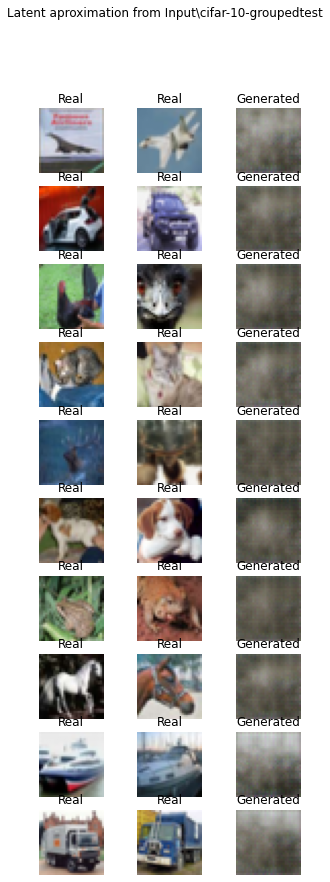

Carpeta Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL_C\ae_MSE_loss\default_disc\disc_binXentropy_loss\1024 ya existe
Entrenando: Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL_C\ae_MSE_loss\default_disc\disc_binXentropy_loss\1024


C:\Users\bitde\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\engine\functional.py:559: UserWarning: Input dict contained keys ['labels'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


E0 <██████████> 100% DISC: [loss: 0.029734, acc: 99.50%] AAE: [mse: 12.630939, b_ce: 0.031141] 37.34s		
E1 <██████████> 100% DISC: [loss: 0.000001, acc: 100.00%] AAE: [mse: 26.510759, b_ce: 0.061197] 36.47s		
E2 <██████████> 100% DISC: [loss: 0.000933, acc: 100.00%] AAE: [mse: 13.529967, b_ce: 0.032004] 36.62s		
E3 <██████████> 100% DISC: [loss: 0.000306, acc: 100.00%] AAE: [mse: 8.959948, b_ce: 0.032591] 35.93s		
E4 <██████████> 100% DISC: [loss: 0.000351, acc: 100.00%] AAE: [mse: 11.196622, b_ce: 0.029473] 36.12s		
E5 <██████████> 100% DISC: [loss: 0.034004, acc: 99.00%] AAE: [mse: 29.524433, b_ce: 0.048978] 35.89s		
E6 <██████████> 100% DISC: [loss: 0.054470, acc: 98.50%] AAE: [mse: 29.224819, b_ce: 0.033306] 36.15s		
E7 <██████████> 100% DISC: [loss: 0.000000, acc: 100.00%] AAE: [mse: 21.400320, b_ce: 0.046568] 36.17s		
E8 <██████████> 100% DISC: [loss: 0.000000, acc: 100.00%] AAE: [mse: 25.694023, b_ce: 0.038412] 36.36s		
E9 <██████████> 100% DISC: [loss: 0.000000, acc: 100.00%] A

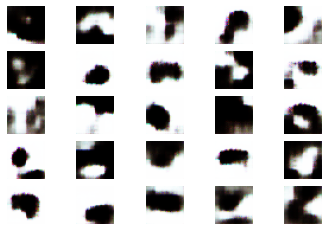

Historia del entrenamiento:


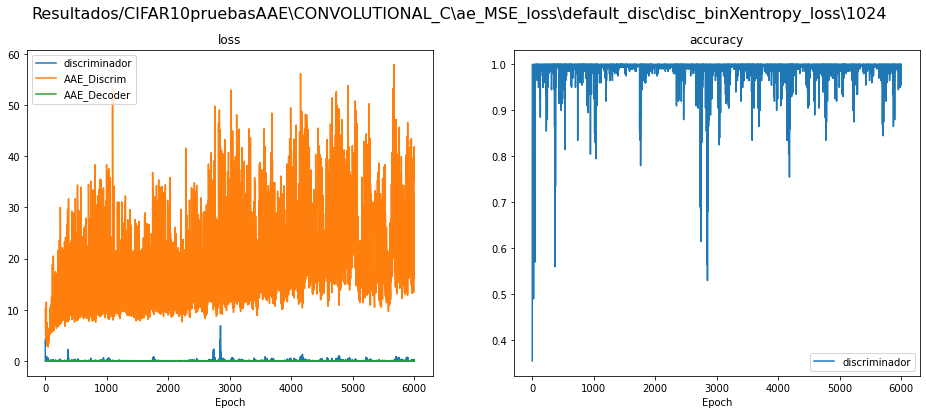

Imagenes regeneradas desde el set de entrenamiento (arriba originales):


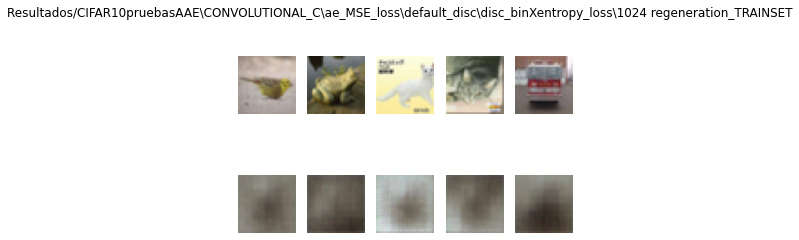

Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):


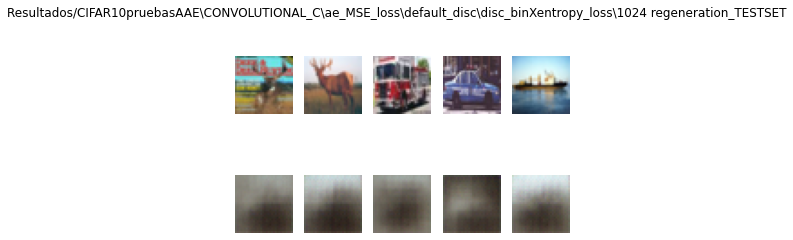

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):


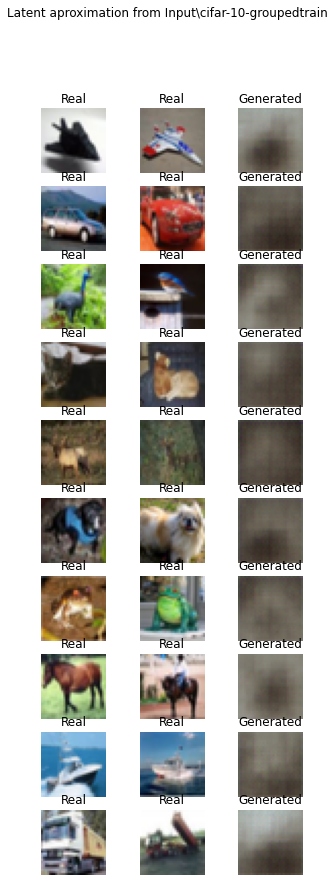

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):


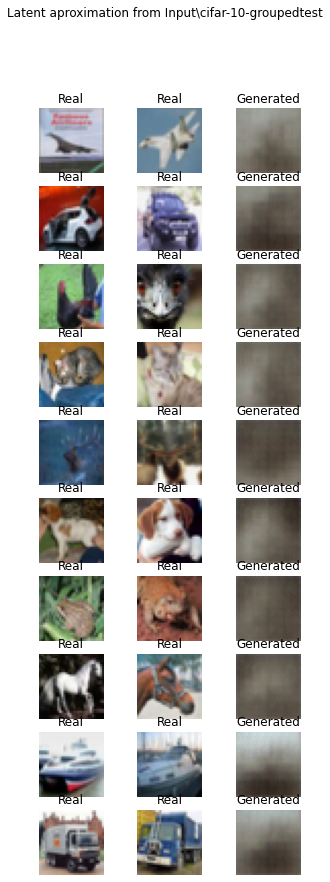

In [16]:
discriminator = (build_class_discriminator ,"class_disc",{"clases":10}, {"truth":true_sampler_clases, "truth_kwargs":{"nclases":10}, "falsehood":fake_class_sampler})
model_name = "CONVOLUTIONAL_C"

encoder = (build_conv_encoder, "dense_enc", {"depth":3})
decoder = (build_conv_decoder,"dense_dec", {"depth":3})
for dim_latente in dim_latente_cand:
    tryModel(enc = encoder, dec=decoder, dim_latente=dim_latente, model_name=model_name, mixture_data={"override":False, "nombre":str(dim_latente)+"convo3Cluster"})

Con clases(cluster)

Carpeta Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL_C\ae_MSE_loss\default_disc\disc_binXentropy_loss\512 ya existe
Entrenando: Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL_C\ae_MSE_loss\default_disc\disc_binXentropy_loss\512


C:\Users\bitde\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\engine\functional.py:559: UserWarning: Input dict contained keys ['labels'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


E0 <██████████> 100% DISC: [loss: 0.000141, acc: 100.00%] AAE: [mse: 10.104095, b_ce: 0.044700] 36.32s		
E1 <██████████> 100% DISC: [loss: 0.001036, acc: 100.00%] AAE: [mse: 11.703810, b_ce: 0.039896] 35.46s		
E2 <██████████> 100% DISC: [loss: 0.021466, acc: 100.00%] AAE: [mse: 42.400669, b_ce: 0.047083] 36.03s		
E3 <██████████> 100% DISC: [loss: 0.000338, acc: 100.00%] AAE: [mse: 11.970504, b_ce: 0.039112] 35.88s		
E4 <██████████> 100% DISC: [loss: 0.000001, acc: 100.00%] AAE: [mse: 14.266498, b_ce: 0.039078] 35.48s		
E5 <██████████> 100% DISC: [loss: 0.037940, acc: 99.00%] AAE: [mse: 34.563770, b_ce: 0.060279] 35.02s		
E6 <██████████> 100% DISC: [loss: 0.002385, acc: 100.00%] AAE: [mse: 20.620367, b_ce: 0.046291] 35.14s		
E7 <██████████> 100% DISC: [loss: 0.000000, acc: 100.00%] AAE: [mse: 21.787657, b_ce: 0.051052] 35.33s		
E8 <██████████> 100% DISC: [loss: 0.124094, acc: 99.50%] AAE: [mse: 25.204399, b_ce: 0.042206] 35.99s		
E9 <██████████> 100% DISC: [loss: 1.241169, acc: 74.00%] 

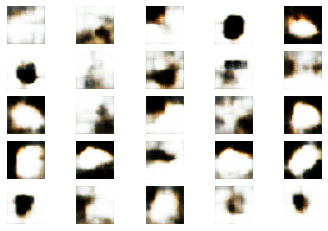

Historia del entrenamiento:


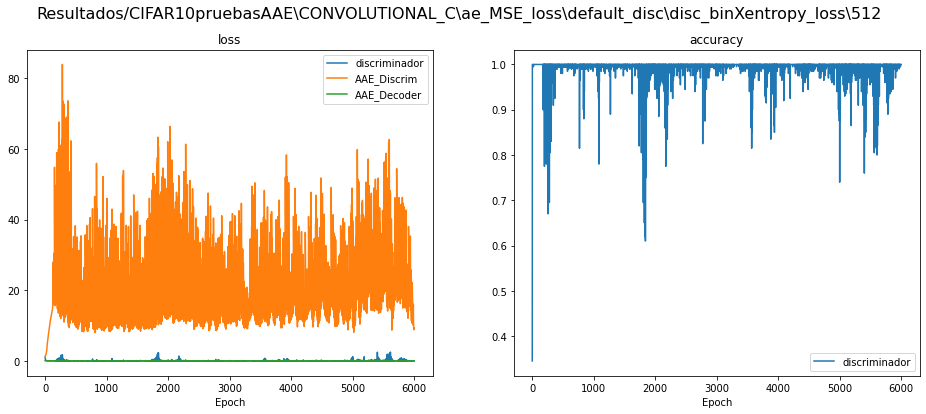

Imagenes regeneradas desde el set de entrenamiento (arriba originales):


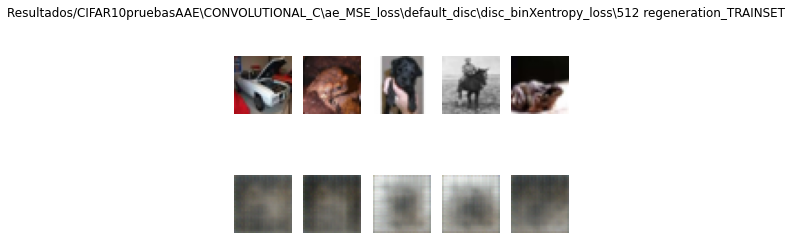

Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):


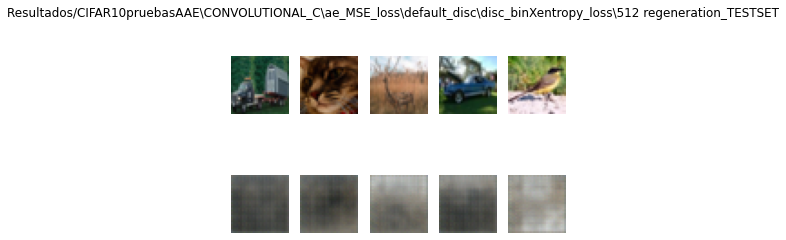

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):


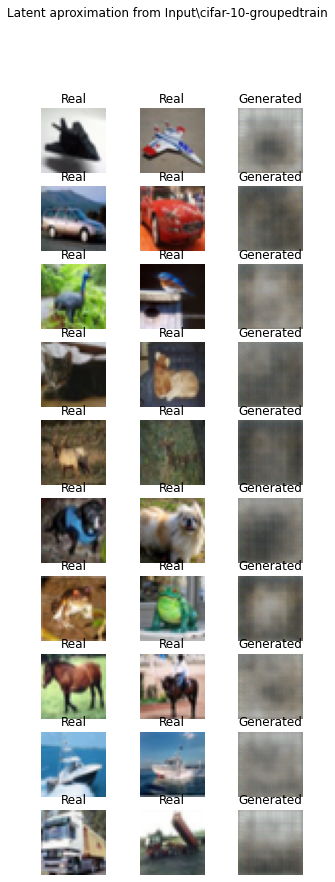

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):


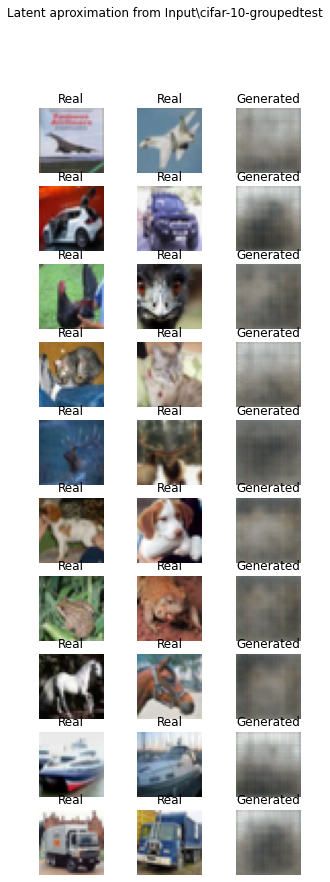

Carpeta Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL_C\ae_MSE_loss\default_disc\disc_binXentropy_loss\1024 ya existe
Entrenando: Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL_C\ae_MSE_loss\default_disc\disc_binXentropy_loss\1024


C:\Users\bitde\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\engine\functional.py:559: UserWarning: Input dict contained keys ['labels'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


E0 <██████████> 100% DISC: [loss: 0.000750, acc: 100.00%] AAE: [mse: 17.589277, b_ce: 0.056202] 38.25s		
E1 <██████████> 100% DISC: [loss: 0.000335, acc: 100.00%] AAE: [mse: 9.307917, b_ce: 0.044035] 36.62s		
E2 <██████████> 100% DISC: [loss: 0.002018, acc: 100.00%] AAE: [mse: 22.919060, b_ce: 0.051480] 36.62s		
E3 <██████████> 100% DISC: [loss: 0.000011, acc: 100.00%] AAE: [mse: 12.275196, b_ce: 0.041555] 36.99s		
E4 <██████████> 100% DISC: [loss: 0.000061, acc: 100.00%] AAE: [mse: 15.953131, b_ce: 0.049290] 37.12s		
E5 <██████████> 100% DISC: [loss: 0.021948, acc: 99.50%] AAE: [mse: 11.299452, b_ce: 0.045558] 36.70s		
E6 <██████████> 100% DISC: [loss: 0.036125, acc: 99.50%] AAE: [mse: 22.600109, b_ce: 0.046129] 36.73s		
E7 <██████████> 100% DISC: [loss: 0.000001, acc: 100.00%] AAE: [mse: 21.140287, b_ce: 0.036504] 35.92s		
E8 <██████████> 100% DISC: [loss: 0.000000, acc: 100.00%] AAE: [mse: 33.082298, b_ce: 0.046216] 36.16s		
E9 <██████████> 100% DISC: [loss: 0.000000, acc: 100.00%] 

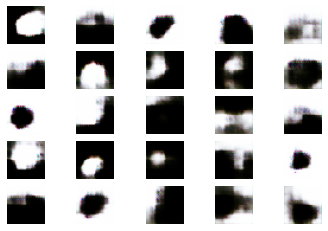

Historia del entrenamiento:


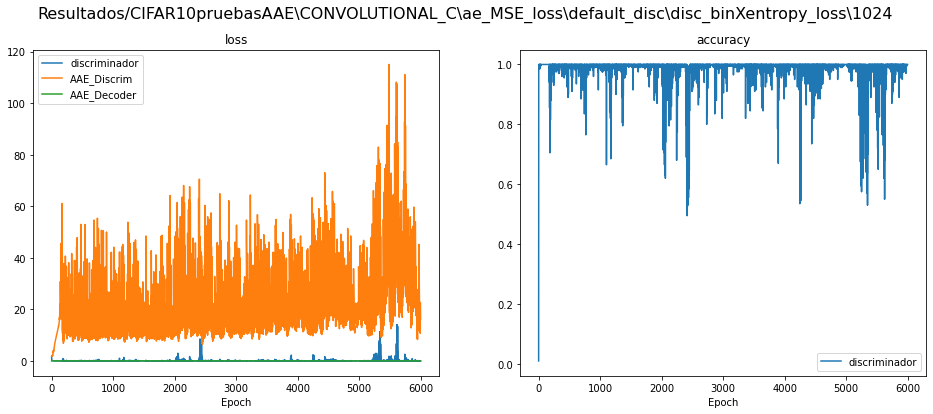

Imagenes regeneradas desde el set de entrenamiento (arriba originales):


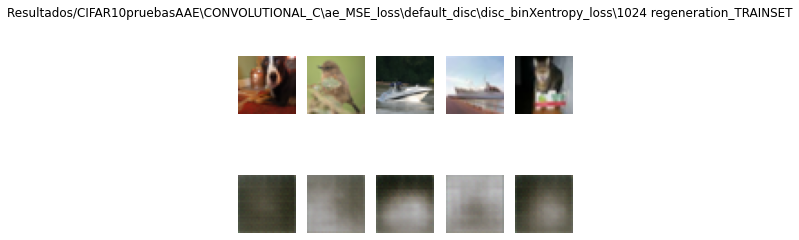

Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):


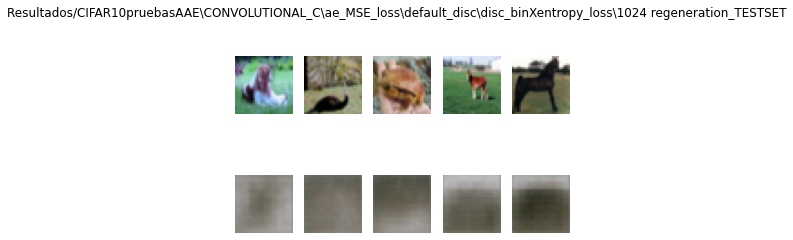

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):


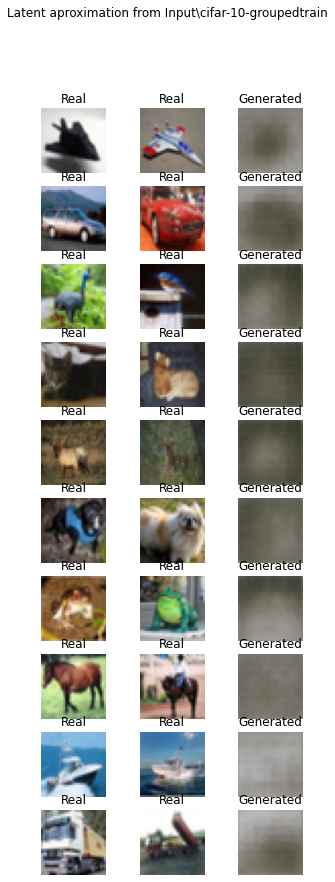

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):


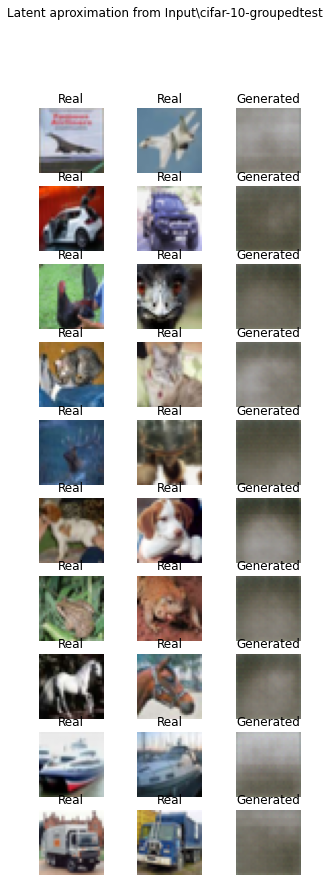

In [17]:

discriminator = (build_class_discriminator ,"class_disc",{"clases":10}, {"truth":genFromMixture, "truth_kwargs":{"nclases":10}, "falsehood":fake_class_sampler})
model_name = "CONVOLUTIONAL_C"

encoder = (build_conv_encoder, "dense_enc", {"depth":3})
decoder = (build_conv_decoder,"dense_dec", {"depth":3})
for dim_latente in dim_latente_cand:
    tryModel(enc = encoder, dec=decoder, dim_latente=dim_latente, model_name=model_name, mixture_data={"override":False, "nombre":str(dim_latente)+"convo3Cluster"})

### Entrenamiento de AAE Convolucional - Def depth, 3p train

Sin clases

Carpeta Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL\ae_MSE_loss\default_disc\disc_binXentropy_loss\512 ya existe
Entrenando: Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL\ae_MSE_loss\default_disc\disc_binXentropy_loss\512


C:\Users\bitde\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\engine\functional.py:559: UserWarning: Input dict contained keys ['labels'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


E0 <██████████> 100% DISC: [loss: 0.035203, acc: 99.00%] AE: [loss: 0.035155] EN-DI [acc: 0.00%] 51.52s		
E1 <██████████> 100% DISC: [loss: 0.004654, acc: 99.50%] AE: [loss: 0.034882] EN-DI [acc: 0.00%] 41.51s		
E2 <██████████> 100% DISC: [loss: 0.025795, acc: 99.50%] AE: [loss: 0.037054] EN-DI [acc: 0.00%] 41.31s		
E3 <██████████> 100% DISC: [loss: 0.000674, acc: 100.00%] AE: [loss: 0.043121] EN-DI [acc: 0.00%] 40.82s		
E4 <██████████> 100% DISC: [loss: 0.008060, acc: 99.50%] AE: [loss: 0.032141] EN-DI [acc: 0.00%] 40.57s		
E5 <██████████> 100% DISC: [loss: 0.054841, acc: 99.00%] AE: [loss: 0.045065] EN-DI [acc: 0.00%] 40.60s		
E6 <██████████> 100% DISC: [loss: 0.324637, acc: 97.00%] AE: [loss: 0.058339] EN-DI [acc: 3.00%] 40.55s		
E7 <██████████> 100% DISC: [loss: 0.022632, acc: 99.50%] AE: [loss: 0.030931] EN-DI [acc: 0.00%] 40.61s		
E8 <██████████> 100% DISC: [loss: 0.001551, acc: 100.00%] AE: [loss: 0.038380] EN-DI [acc: 0.00%] 40.66s		
E9 <██████████> 100% DISC: [loss: 0.000000, 

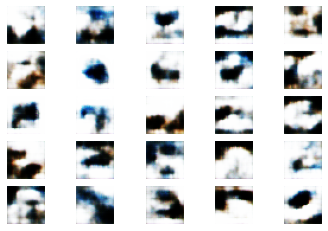

Guardando datos de la mixtura para CIFAR10-512convoCluster
Historia del entrenamiento:


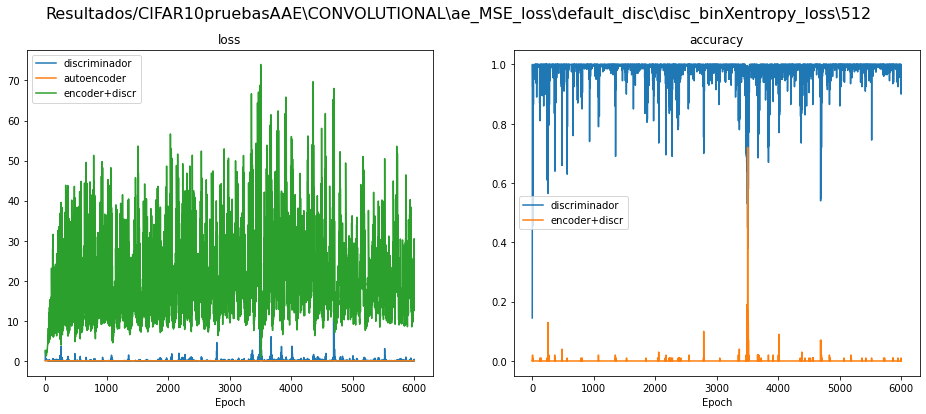

Imagenes regeneradas desde el set de entrenamiento (arriba originales):


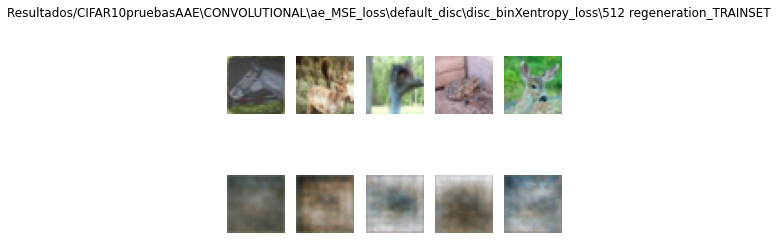

Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):


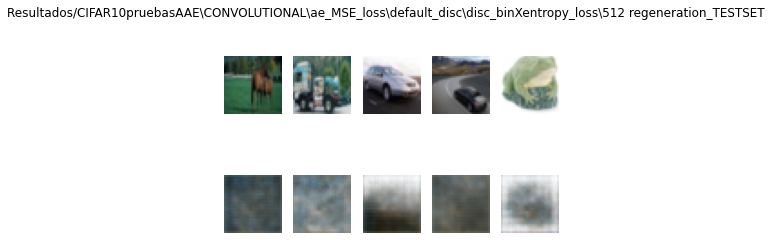

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):


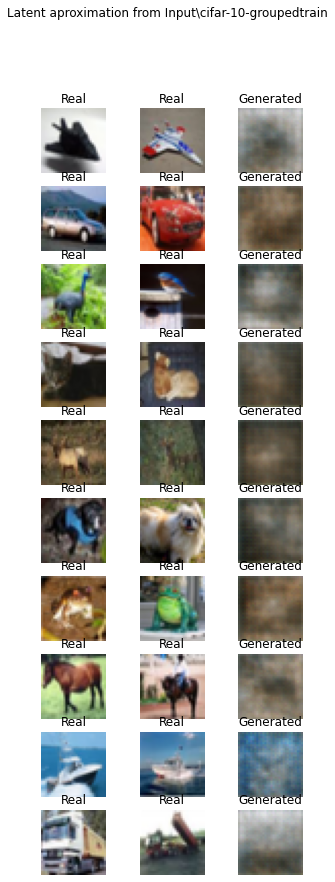

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):


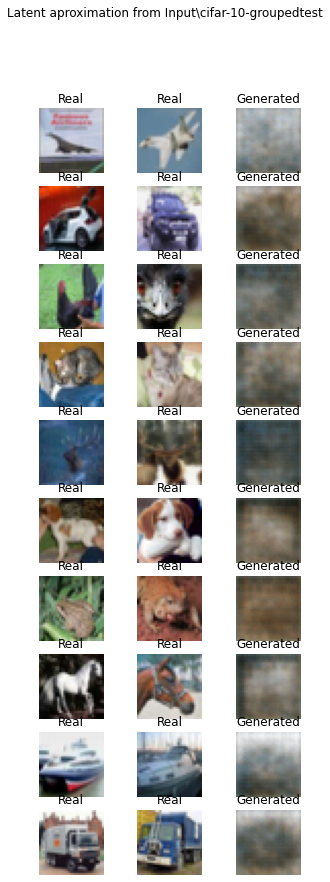

Carpeta Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL\ae_MSE_loss\default_disc\disc_binXentropy_loss\1024 ya existe
Entrenando: Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL\ae_MSE_loss\default_disc\disc_binXentropy_loss\1024


C:\Users\bitde\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\engine\functional.py:559: UserWarning: Input dict contained keys ['labels'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


E0 <██████████> 100% DISC: [loss: 0.003103, acc: 100.00%] AE: [loss: 0.042024] EN-DI [acc: 0.00%] 42.71s		
E1 <██████████> 100% DISC: [loss: 0.000033, acc: 100.00%] AE: [loss: 0.037659] EN-DI [acc: 0.00%] 41.89s		
E2 <██████████> 100% DISC: [loss: 0.481629, acc: 85.00%] AE: [loss: 0.042254] EN-DI [acc: 0.00%] 41.69s		
E3 <██████████> 100% DISC: [loss: 0.000048, acc: 100.00%] AE: [loss: 0.033728] EN-DI [acc: 0.00%] 41.76s		
E4 <██████████> 100% DISC: [loss: 0.040116, acc: 99.00%] AE: [loss: 0.041010] EN-DI [acc: 0.00%] 41.56s		
E5 <██████████> 100% DISC: [loss: 0.000000, acc: 100.00%] AE: [loss: 0.032999] EN-DI [acc: 0.00%] 41.65s		
E6 <██████████> 100% DISC: [loss: 0.006681, acc: 99.50%] AE: [loss: 0.038917] EN-DI [acc: 0.00%] 41.59s		
E7 <██████████> 100% DISC: [loss: 0.013255, acc: 99.50%] AE: [loss: 0.029917] EN-DI [acc: 0.00%] 41.62s		
E8 <██████████> 100% DISC: [loss: 0.040695, acc: 99.50%] AE: [loss: 0.035531] EN-DI [acc: 0.00%] 41.63s		
E9 <██████████> 100% DISC: [loss: 0.000001

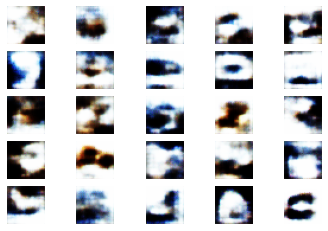

Guardando datos de la mixtura para CIFAR10-1024convoCluster
Historia del entrenamiento:


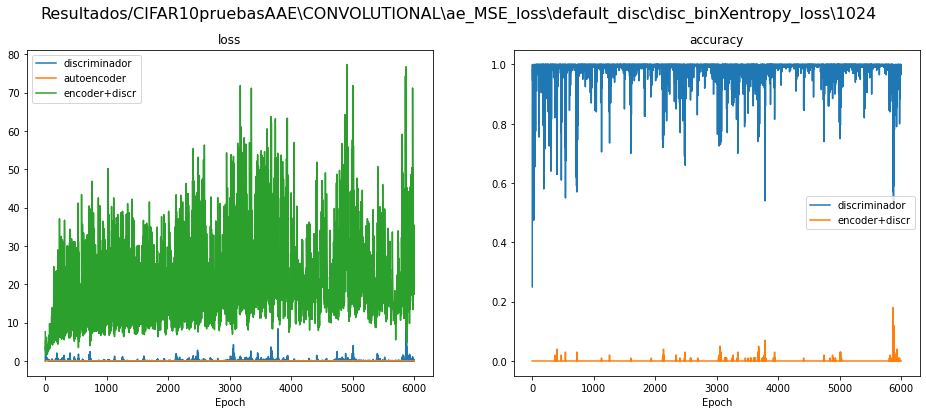

Imagenes regeneradas desde el set de entrenamiento (arriba originales):


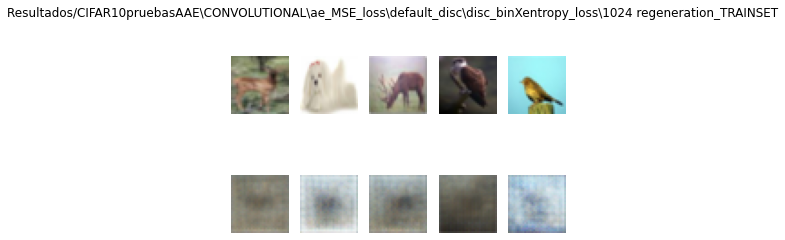

Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):


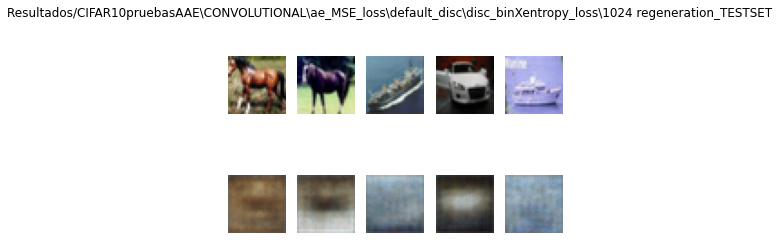

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):


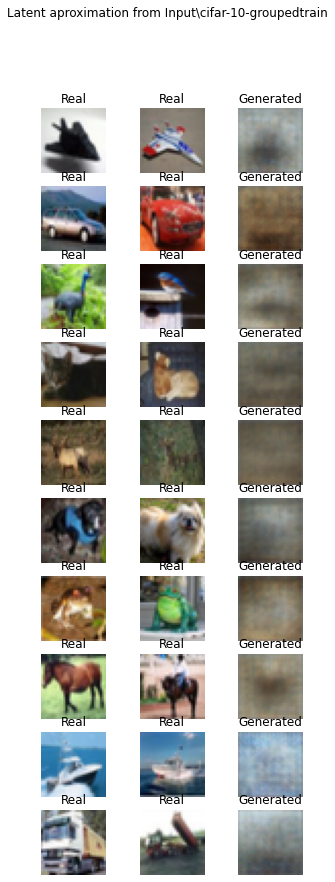

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):


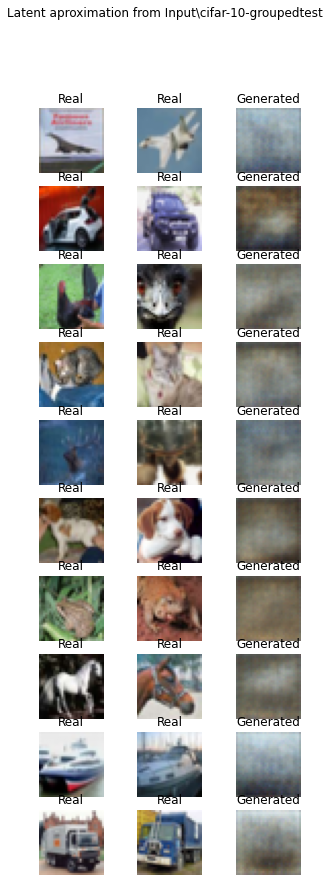

In [11]:
model_name = "CONVOLUTIONAL"

encoder = (build_conv_encoder, "dense_enc", {})
decoder = (build_conv_decoder,"dense_dec", {})
for dim_latente in dim_latente_cand:
    tryModel(assemble_AAE=assemble_AAE_threePhased, fit_AAE=fit_AAE_threePhased,enc = encoder, dec=decoder, dim_latente=dim_latente, model_name=model_name, mixture_data={"override":True, "nombre":str(dim_latente)+"convoCluster"})


Con clases

Carpeta Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL_C\ae_MSE_loss\default_disc\disc_binXentropy_loss\512 ya existe
Entrenando: Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL_C\ae_MSE_loss\default_disc\disc_binXentropy_loss\512


C:\Users\bitde\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\engine\functional.py:559: UserWarning: Input dict contained keys ['labels'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


E0 <██████████> 100% DISC: [loss: 0.000632, acc: 100.00%] AE: [loss: 0.038096] EN-DI [acc: 0.00%] 41.42s		
E1 <██████████> 100% DISC: [loss: 0.000004, acc: 100.00%] AE: [loss: 0.032059] EN-DI [acc: 0.00%] 40.44s		
E2 <██████████> 100% DISC: [loss: 0.761523, acc: 81.00%] AE: [loss: 0.032469] EN-DI [acc: 0.00%] 40.51s		
E3 <██████████> 100% DISC: [loss: 0.051668, acc: 98.00%] AE: [loss: 0.037087] EN-DI [acc: 0.00%] 40.56s		
E4 <██████████> 100% DISC: [loss: 0.025283, acc: 99.50%] AE: [loss: 0.037951] EN-DI [acc: 0.00%] 40.61s		
E5 <██████████> 100% DISC: [loss: 0.080577, acc: 96.00%] AE: [loss: 0.035214] EN-DI [acc: 0.00%] 40.58s		
E6 <██████████> 100% DISC: [loss: 0.000025, acc: 100.00%] AE: [loss: 0.036070] EN-DI [acc: 0.00%] 40.57s		
E7 <██████████> 100% DISC: [loss: 0.022035, acc: 99.50%] AE: [loss: 0.034280] EN-DI [acc: 0.00%] 40.71s		
E8 <██████████> 100% DISC: [loss: 2.426739, acc: 62.50%] AE: [loss: 0.040208] EN-DI [acc: 0.00%] 40.61s		
E9 <██████████> 100% DISC: [loss: 0.059768,

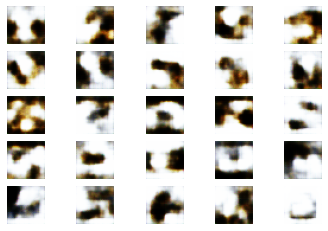

Guardando datos de la mixtura para CIFAR10-512convoCluster
Historia del entrenamiento:


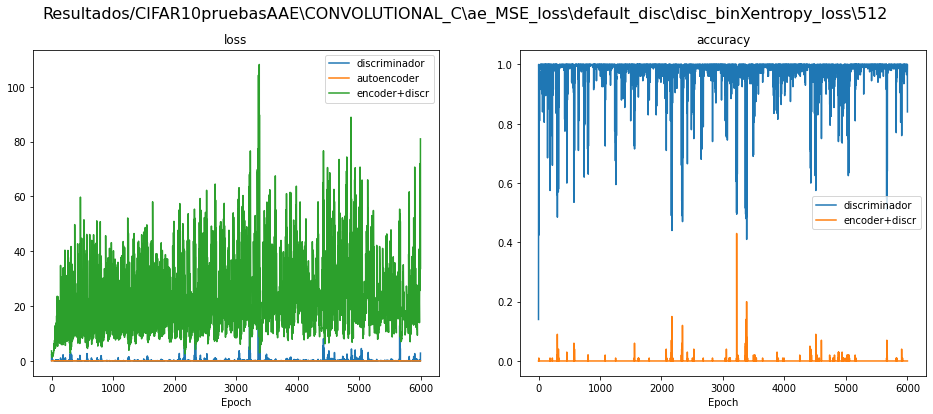

Imagenes regeneradas desde el set de entrenamiento (arriba originales):


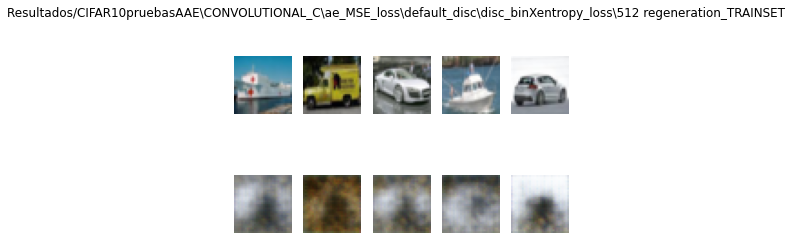

Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):


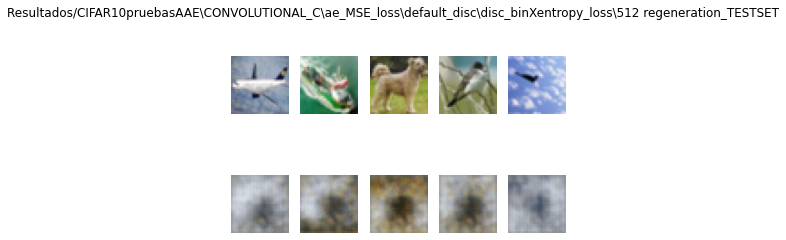

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):


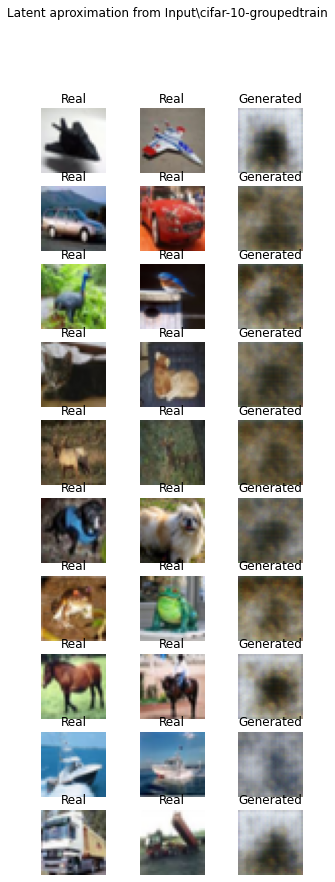

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):


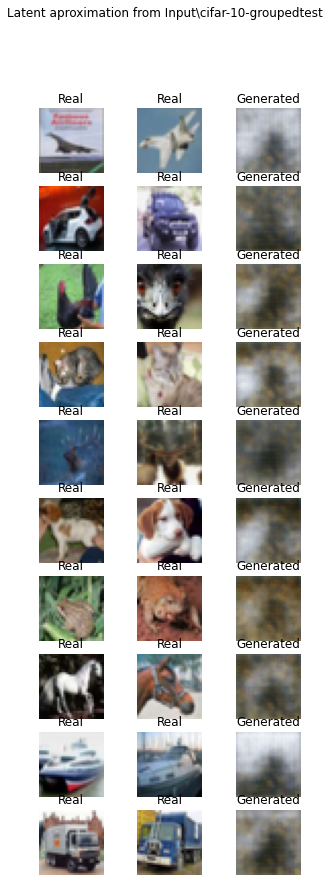

Carpeta Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL_C\ae_MSE_loss\default_disc\disc_binXentropy_loss\1024 ya existe
Entrenando: Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL_C\ae_MSE_loss\default_disc\disc_binXentropy_loss\1024


C:\Users\bitde\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\engine\functional.py:559: UserWarning: Input dict contained keys ['labels'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


E0 <██████████> 100% DISC: [loss: 0.241692, acc: 91.50%] AE: [loss: 0.034937] EN-DI [acc: 0.00%] 42.43s		
E1 <██████████> 100% DISC: [loss: 0.034040, acc: 99.00%] AE: [loss: 0.028450] EN-DI [acc: 0.00%] 41.45s		
E2 <██████████> 100% DISC: [loss: 0.002604, acc: 100.00%] AE: [loss: 0.051186] EN-DI [acc: 0.00%] 42.00s		
E3 <██████████> 100% DISC: [loss: 0.029451, acc: 99.00%] AE: [loss: 0.033637] EN-DI [acc: 0.00%] 41.67s		
E4 <██████████> 100% DISC: [loss: 0.001424, acc: 100.00%] AE: [loss: 0.038586] EN-DI [acc: 0.00%] 41.50s		
E5 <██████████> 100% DISC: [loss: 0.000268, acc: 100.00%] AE: [loss: 0.033665] EN-DI [acc: 0.00%] 41.40s		
E6 <██████████> 100% DISC: [loss: 0.112015, acc: 98.00%] AE: [loss: 0.028617] EN-DI [acc: 0.00%] 41.48s		
E7 <██████████> 100% DISC: [loss: 0.042728, acc: 99.00%] AE: [loss: 0.026359] EN-DI [acc: 0.00%] 41.41s		
E8 <██████████> 100% DISC: [loss: 0.081773, acc: 99.00%] AE: [loss: 0.032100] EN-DI [acc: 0.00%] 41.63s		
E9 <██████████> 100% DISC: [loss: 0.014051,

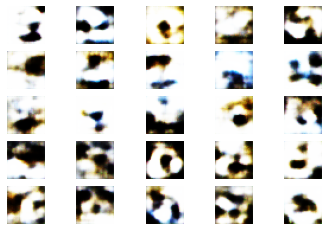

Guardando datos de la mixtura para CIFAR10-1024convoCluster
Historia del entrenamiento:


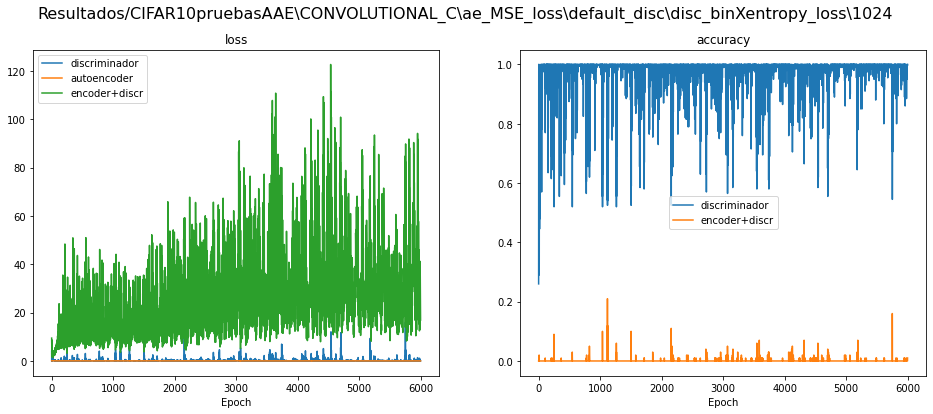

Imagenes regeneradas desde el set de entrenamiento (arriba originales):


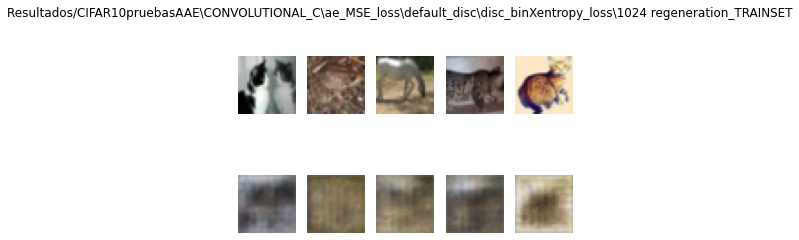

Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):


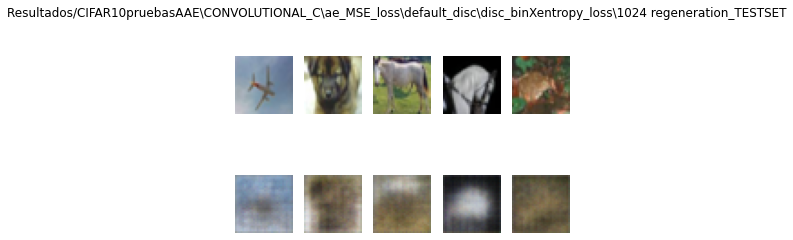

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):


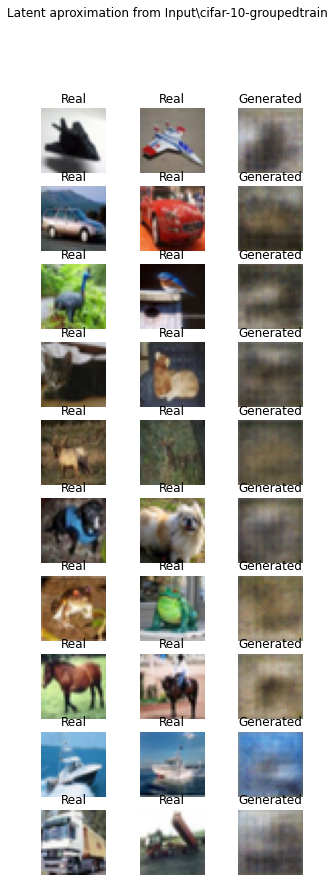

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):


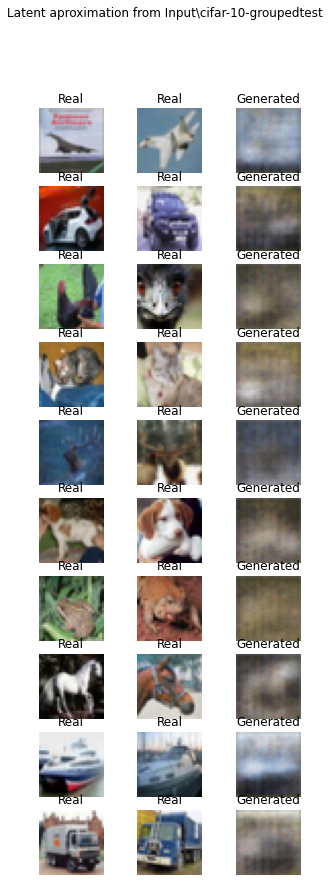

In [12]:
discriminator = (build_class_discriminator ,"class_disc",{"clases":10}, {"truth":true_sampler_clases, "truth_kwargs":{"nclases":10}, "falsehood":fake_class_sampler})
model_name = "CONVOLUTIONAL_C"

encoder = (build_conv_encoder, "dense_enc", {})
decoder = (build_conv_decoder,"dense_dec", {})
for dim_latente in dim_latente_cand:
    tryModel(assemble_AAE=assemble_AAE_threePhased, fit_AAE=fit_AAE_threePhased,enc = encoder, dec=decoder, dim_latente=dim_latente, model_name=model_name, mixture_data={"override":True, "nombre":str(dim_latente)+"convoCluster"})

Con clases(cluster)

Carpeta Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL_C\ae_MSE_loss\default_disc\disc_binXentropy_loss\512 ya existe
Entrenando: Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL_C\ae_MSE_loss\default_disc\disc_binXentropy_loss\512


C:\Users\bitde\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\engine\functional.py:559: UserWarning: Input dict contained keys ['labels'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


E0 <██████████> 100% DISC: [loss: 0.017288, acc: 99.50%] AE: [loss: 0.048832] EN-DI [acc: 0.00%] 41.61s		
E1 <██████████> 100% DISC: [loss: 0.004875, acc: 99.50%] AE: [loss: 0.048866] EN-DI [acc: 0.00%] 40.51s		
E2 <██████████> 100% DISC: [loss: 0.000044, acc: 100.00%] AE: [loss: 0.044272] EN-DI [acc: 0.00%] 40.43s		
E3 <██████████> 100% DISC: [loss: 0.000000, acc: 100.00%] AE: [loss: 0.047506] EN-DI [acc: 0.00%] 40.39s		
E4 <██████████> 100% DISC: [loss: 0.000007, acc: 100.00%] AE: [loss: 0.039204] EN-DI [acc: 0.00%] 40.27s		
E5 <██████████> 100% DISC: [loss: 0.000001, acc: 100.00%] AE: [loss: 0.047351] EN-DI [acc: 0.00%] 40.46s		
E6 <██████████> 100% DISC: [loss: 0.000056, acc: 100.00%] AE: [loss: 0.041716] EN-DI [acc: 0.00%] 40.71s		
E7 <██████████> 100% DISC: [loss: 0.000000, acc: 100.00%] AE: [loss: 0.035357] EN-DI [acc: 0.00%] 40.79s		
E8 <██████████> 100% DISC: [loss: 0.017742, acc: 99.00%] AE: [loss: 0.033935] EN-DI [acc: 0.00%] 40.76s		
E9 <██████████> 100% DISC: [loss: 0.1203

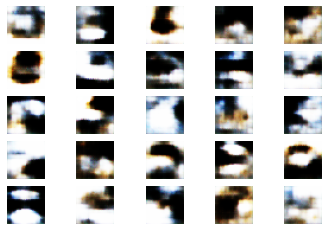

Guardando datos de la mixtura para CIFAR10-512convoCluster
Historia del entrenamiento:


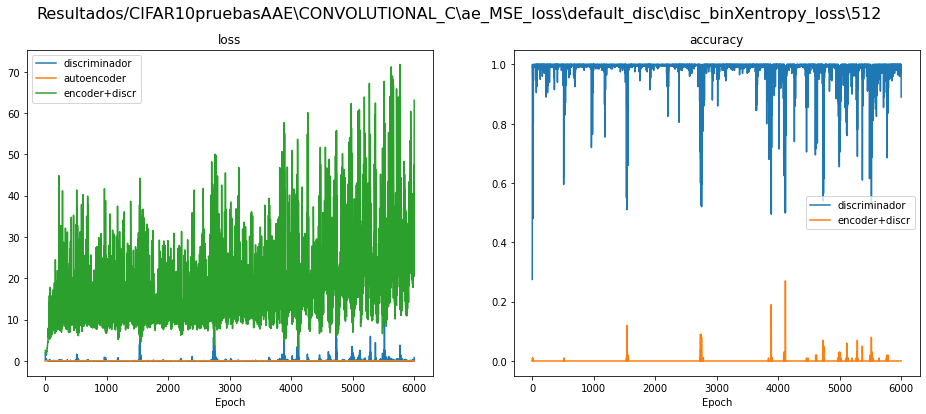

Imagenes regeneradas desde el set de entrenamiento (arriba originales):


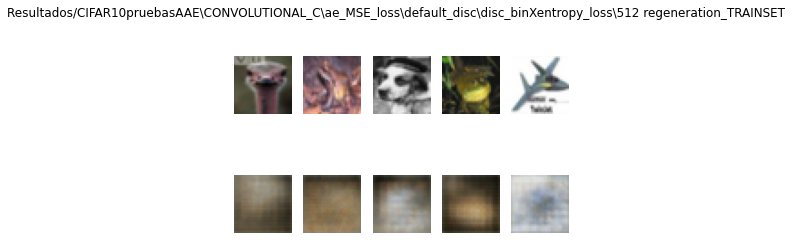

Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):


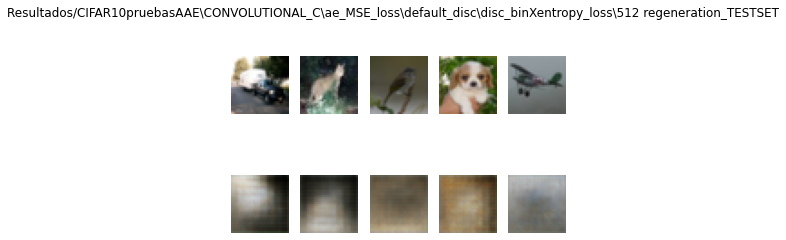

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):


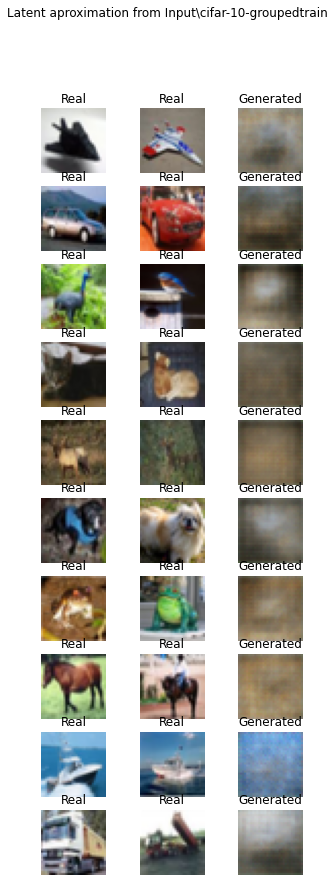

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):


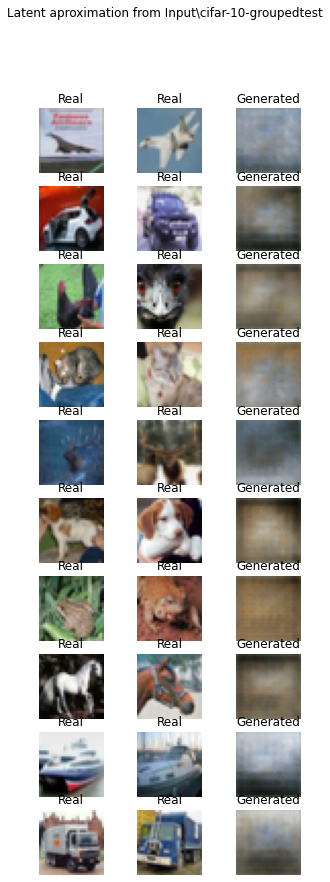

Carpeta Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL_C\ae_MSE_loss\default_disc\disc_binXentropy_loss\1024 ya existe
Entrenando: Resultados/CIFAR10pruebasAAE\CONVOLUTIONAL_C\ae_MSE_loss\default_disc\disc_binXentropy_loss\1024


C:\Users\bitde\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\engine\functional.py:559: UserWarning: Input dict contained keys ['labels'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


E0 <██████████> 100% DISC: [loss: 0.000063, acc: 100.00%] AE: [loss: 0.030773] EN-DI [acc: 0.00%] 42.82s		
E1 <██████████> 100% DISC: [loss: 0.038320, acc: 98.50%] AE: [loss: 0.035949] EN-DI [acc: 0.00%] 41.54s		
E2 <██████████> 100% DISC: [loss: 0.004186, acc: 100.00%] AE: [loss: 0.050857] EN-DI [acc: 0.00%] 41.53s		
E3 <██████████> 100% DISC: [loss: 0.025134, acc: 99.00%] AE: [loss: 0.040327] EN-DI [acc: 0.00%] 41.49s		
E4 <██████████> 100% DISC: [loss: 0.002094, acc: 100.00%] AE: [loss: 0.031430] EN-DI [acc: 0.00%] 41.80s		
E5 <██████████> 100% DISC: [loss: 0.000007, acc: 100.00%] AE: [loss: 0.035238] EN-DI [acc: 0.00%] 41.36s		
E6 <██████████> 100% DISC: [loss: 0.108319, acc: 98.50%] AE: [loss: 0.059499] EN-DI [acc: 0.00%] 41.41s		
E7 <██████████> 100% DISC: [loss: 0.113733, acc: 98.00%] AE: [loss: 0.030884] EN-DI [acc: 0.00%] 41.71s		
E8 <██████████> 100% DISC: [loss: 0.010403, acc: 99.50%] AE: [loss: 0.027545] EN-DI [acc: 0.00%] 41.55s		
E9 <██████████> 100% DISC: [loss: 0.000123

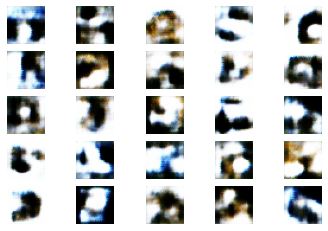

Guardando datos de la mixtura para CIFAR10-1024convoCluster
Historia del entrenamiento:


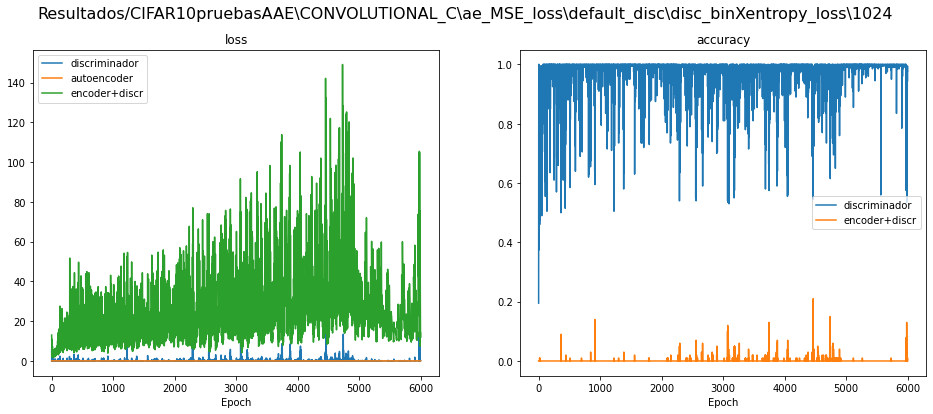

Imagenes regeneradas desde el set de entrenamiento (arriba originales):


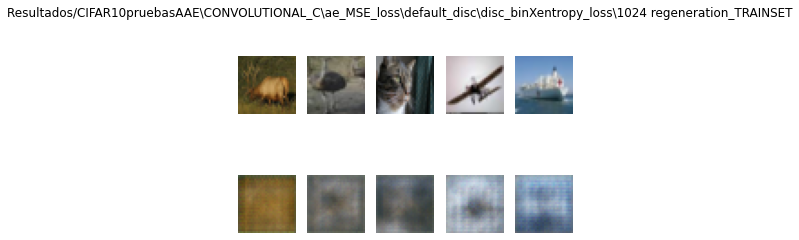

Imagenes regeneradas desde imagenes nunca vistas por la red (arriba originales):


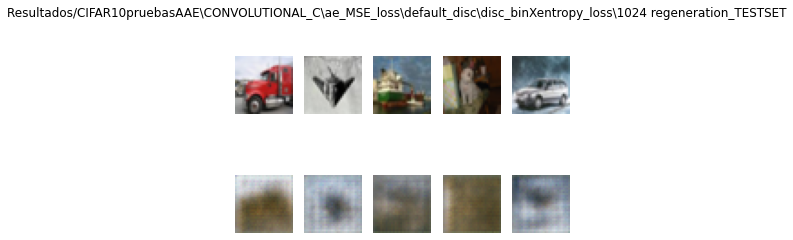

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Train):


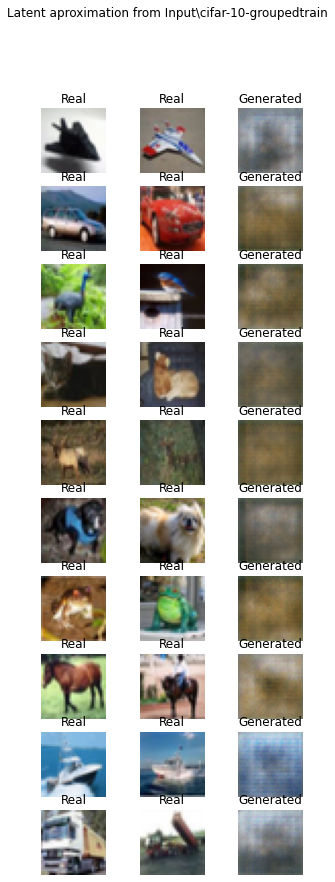

Imagenes generadas desde una aproximacion a coordenadas del espacio latente (Test):


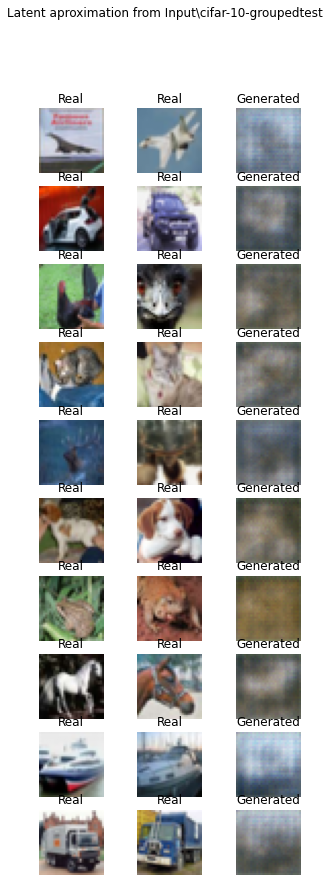

In [13]:

discriminator = (build_class_discriminator ,"class_disc",{"clases":10}, {"truth":genFromMixture, "truth_kwargs":{"nclases":10}, "falsehood":fake_class_sampler})
model_name = "CONVOLUTIONAL_C"

encoder = (build_conv_encoder, "dense_enc", {})
decoder = (build_conv_decoder,"dense_dec", {})
for dim_latente in dim_latente_cand:
    tryModel(assemble_AAE=assemble_AAE_threePhased, fit_AAE=fit_AAE_threePhased,enc = encoder, dec=decoder, dim_latente=dim_latente, model_name=model_name, mixture_data={"override":True, "nombre":str(dim_latente)+"convoCluster"})